## Load notebook

### Python modules

In [3]:
# standard libs
import numpy as np
import pandas as pd
from scipy import sparse
import lmfit as lm
from tqdm import tqdm
import io, sys, importlib
from contextlib import redirect_stdout

# matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18

# XPCS library
sys.path.append('./XPCSlibrary/')

import ID10tools as ID10
from ID10tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCStools as XPCS
from XPCStools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAYtools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

#### EXPERIMENTAL VARIABLES ####
XPCS.set_expvar(1350, 1350, 7.1)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000
################################

###### FOLDER PATHS ######
from folder_paths import *
##########################

### Functions

In [4]:
def MTplotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=True):

    print("Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan")
    global model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan  

    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    
    g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])

    # FIT DATA
    # time-mask 4 fitting
    tmask = (t1_fit<g2[0])*(g2[0]<t2_fit)
    x, y, dy =  g2[0][tmask], g2[1][tmask], g2[2][tmask]
    
    # compute and save the fit
    fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
    g2fit.loc[0] = [Q_notebook, dQ_notebook,
                    fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                    fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                    fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                    fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                    fit.redchi,]
    if save: g2fit.to_csv(f"{g2fit4damaged_vGeO2_folder}g2fit-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", index=False)
    
    # print fit report
    display(g2fit)

    # PLOT FIT AND RESIDUALS IN SUBPLOTS
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), gridspec_kw={'height_ratios': [3, 1], 'hspace': 0.05}, sharex=True)

    # Main fit plot
    ax1.errorbar(g2[0], g2[1], yerr=g2[2], c='C0', marker='o', linestyle='None')
    xfit = np.arange(np.min(g2[0]), np.max(g2[0]), 1e-2)
    yfit = fit.eval(t=xfit)
    ax1.plot(xfit, yfit, c='black', linestyle='--')
    if t1_fit != 0:
        ax1.axvline(t1_fit, color='red', linestyle='--')
    if t2_fit != 1e100:
        ax1.axvline(t2_fit, color='red', linestyle='--')
    ax1.set_ylabel('g2')
    ax1.set_xscale('log')
    ax1.set_ylim(bottom=1, top=np.max(g2[1] + g2[2]))

    # Residuals plot
    residuals = (g2[1] - fit.eval(t=g2[0]))/ g2[2]
    ax2.scatter(g2[0], residuals, color='C0')
    ax2.axhline(0, color='black', linestyle='-')
    ax2.axhline(1, color='black', linestyle='--')
    ax2.axhline(-1, color='black', linestyle='--')
    ax2.set_xlabel('t [s]')
    ax2.set_ylabel('Res/$\\sigma$')
    ax2.set_xscale('log')

    plt.setp(ax1.get_xticklabels(), visible=False)

    return fig, ax1, ax2

### Load masks

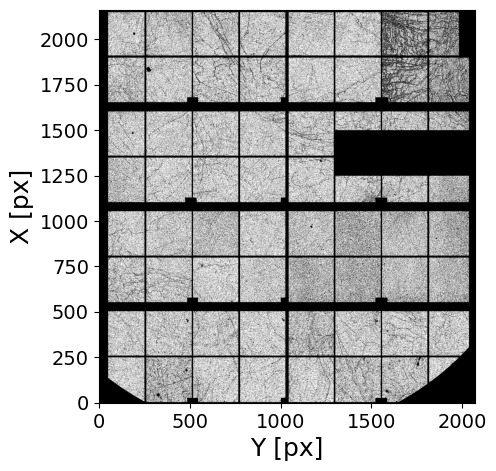

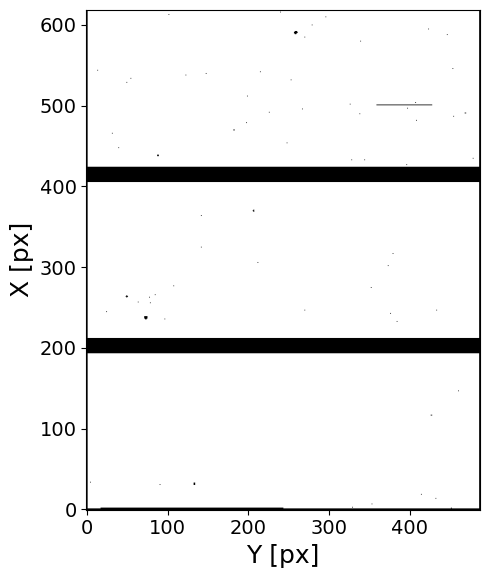

In [5]:
### e4m MASKS
e4m_htmask_GeO2_7_30C  = np.load(MASKS_folder+'e4m_htmask-GeO2_7_30C_0003_0003' +'.npy')
e4m_htmask_GeO2_7_100C = np.load(MASKS_folder+'e4m_htmask-GeO2_7_100C_0001_0003'+'.npy')
e4m_htmask_GeO2_7_170C = np.load(MASKS_folder+'e4m_htmask-GeO2_7_170C_0001_0003'+'.npy')
e4m_htmask_GeO2_7_240C = np.load(MASKS_folder+'e4m_htmask-GeO2_7_240C_0001_0003'+'.npy')
e4m_htmask = e4m_htmask_GeO2_7_30C * e4m_htmask_GeO2_7_100C * e4m_htmask_GeO2_7_170C * e4m_htmask_GeO2_7_240C

e4m_mask = np.load(MASKS_folder+'e4m_mask'+'.npy')

plt.figure(figsize=(5, 5))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### pilatus MASKS
pilatus_mask = np.load(MASKS_folder+'pilatus300k_mask_20240201'+'.npy').astype(bool)

plt.figure(figsize=(6, 6))
plt.imshow(~pilatus_mask, cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### Beamstop mask

In [6]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 3
Nscan = 3
Nfi, Nff = 0, 1000
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done! (elapsed time = 0.01 s)
Concatenating vectors ...
Done! (elapsed time = 0.0 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_7_30C/GeO2_7_30C_0003/scan0003/
	 | Shape:       (1000, 4471016)
	 | Sparsity:     1.5e-04
	 | Memory usage (scipy.csr_array): 0.007 GB (np.array usage: 16.656 GB)


################################################################################
Maximum count in the whole run -> 242.0
# of pixels above Ith_high treshold ->  610960 pixels (of 4471016 => 13.66 %)
################################################################################



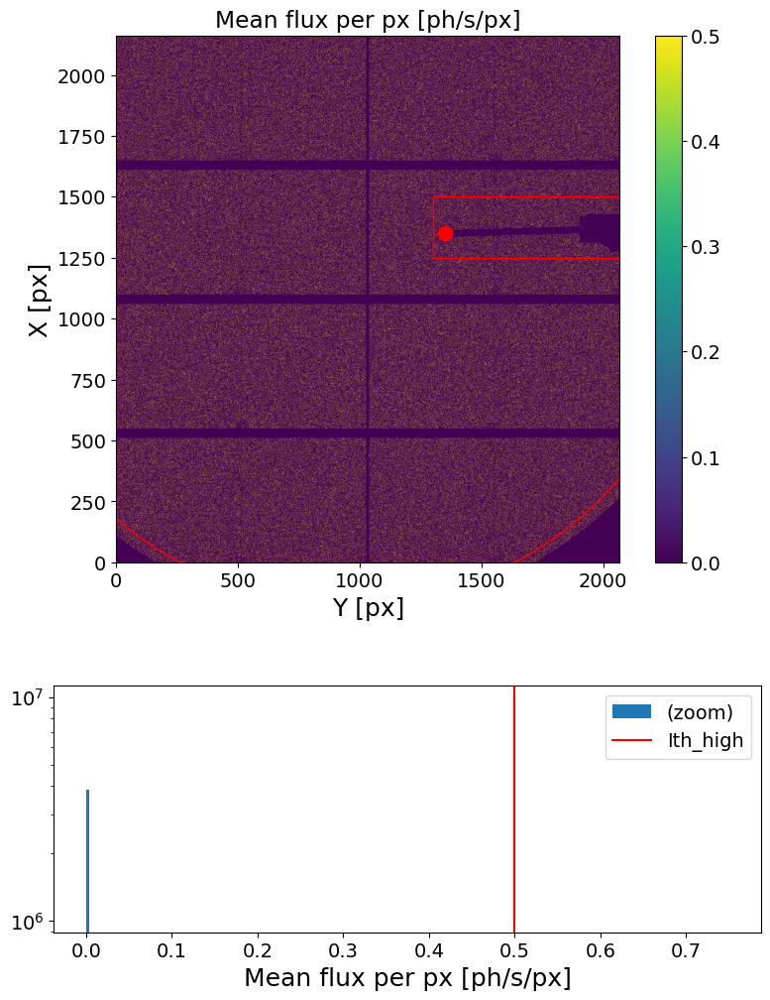

In [7]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.5, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



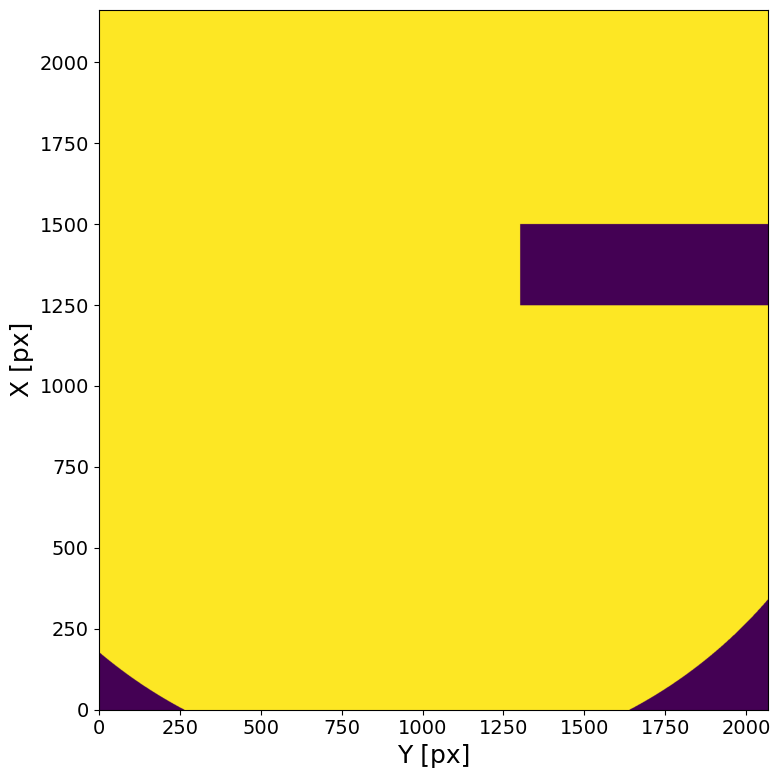

In [8]:
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Q mask

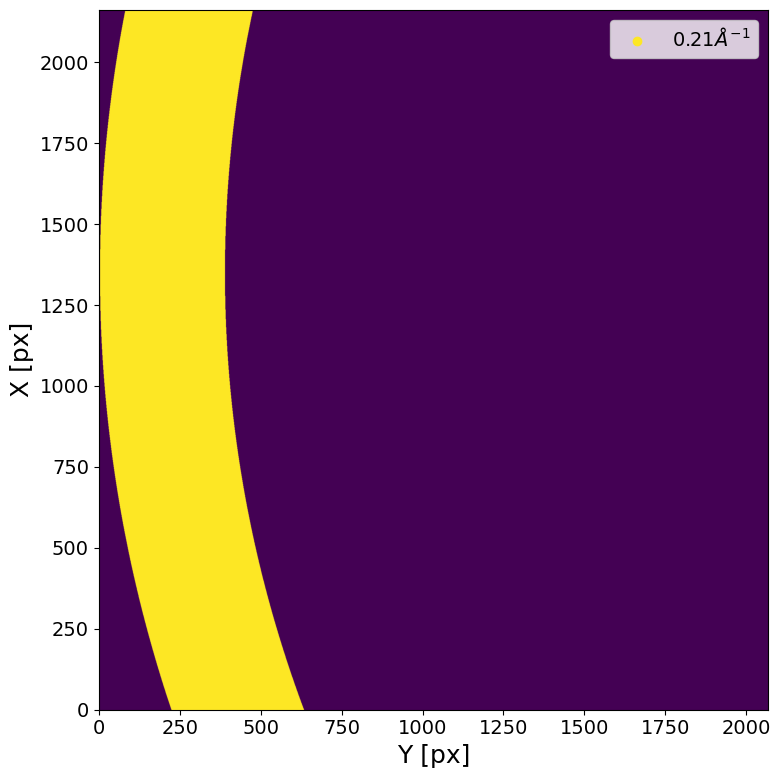

In [9]:
###################
Q_notebook = .21 # [.21, .19, .17, .15, .13]
dQ_notebook = .01 # => Q_width = 2*dQ
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Q_notebook, dQ_notebook, Qmap_plot=False)

### htmask killed pixels ?

In [10]:
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_30C:  {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_30C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_100C: {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_100C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_170C: {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_170C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_240C: {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_240C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')

print(f'Percentage of kept pixel by e4m_htmask:             {round((bs_mask*Qmask*e4m_mask*e4m_htmask).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')

Percentage of kept pixel by e4m_htmask_GeO2_7_30C:  88.66%
Percentage of kept pixel by e4m_htmask_GeO2_7_100C: 91.55%
Percentage of kept pixel by e4m_htmask_GeO2_7_170C: 87.1%
Percentage of kept pixel by e4m_htmask_GeO2_7_240C: 94.27%
Percentage of kept pixel by e4m_htmask:             74.28%


## XPCS scan [short]: T=30C, Q=0.19, 5min @ 1ms (GeO2_3_alligment, dataset 1, scan 6)

In [9]:
#######################################
sample_name = 'GeO2_3_alligment'
Ndataset = 1
Nscan = 6
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 300048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 5.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/61 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



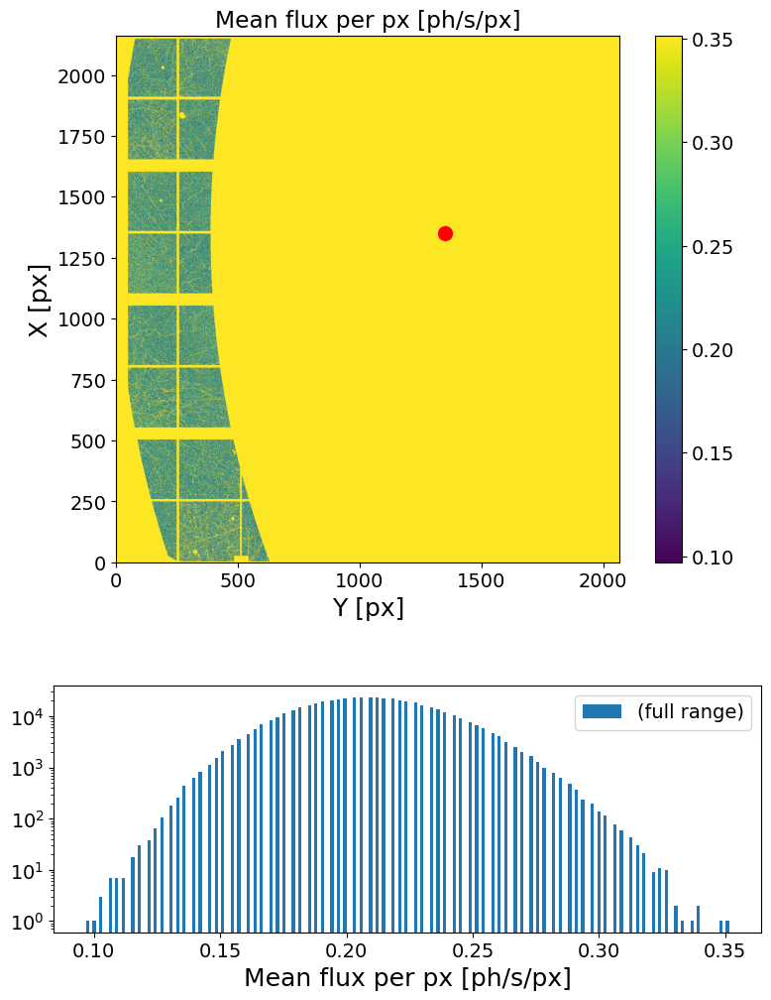

In [10]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [11]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

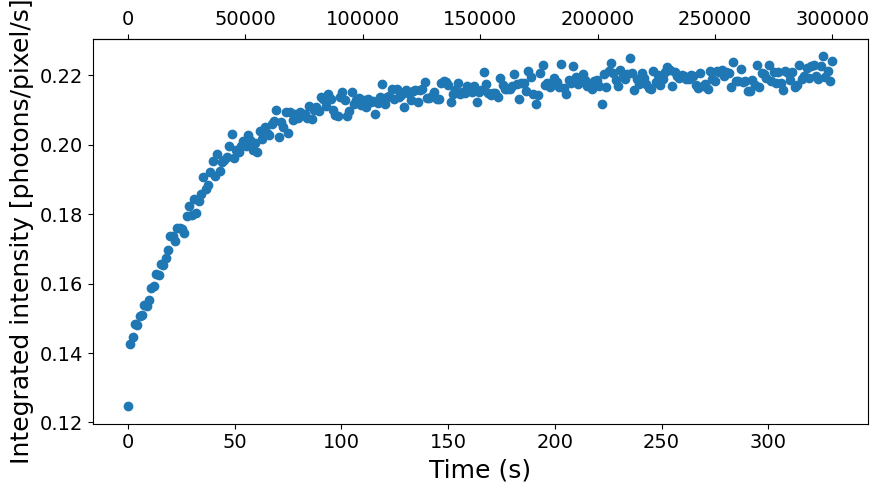

In [12]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

## XPCS scan: T=30C, Q=0.19, 25min @ 1ms ON fp (GeO2_3, dataset 1, scan 4)

In [13]:
#######################################
sample_name = 'GeO2_3_30C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None #900_000
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



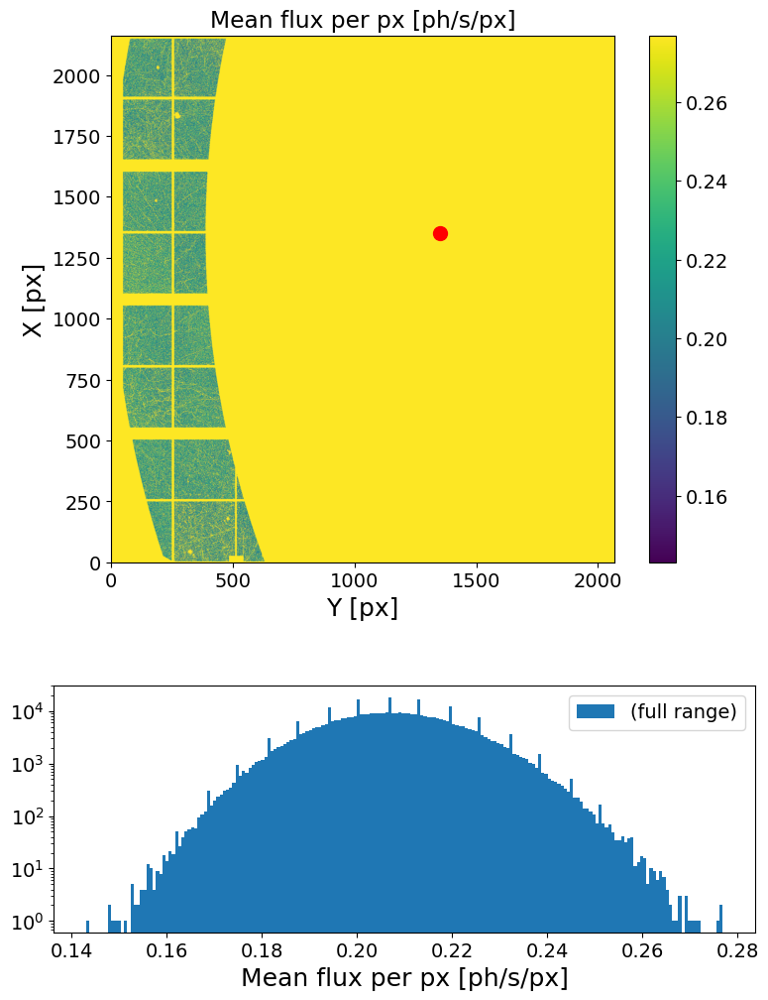

In [14]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [15]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

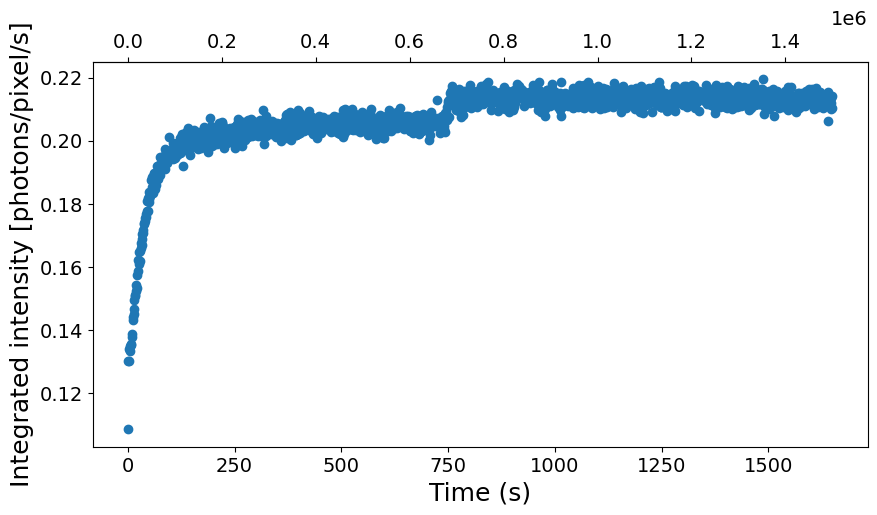

In [16]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [17]:
##### INPUTS #####
Nfi = int(.7e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1486432 => (Nff-Nfi) = 48*2^sparse_depth, thrown frames = 13808 (1.73%)
Loading frames ...
Done! (elapsed time = 1.42 s)
	 | 786432 frames X 523950 pixels
	 | sparsity = 2.35e-04
	 | memory usage (sparse.csr_array @ float32) = 1.088 GB
Computing sparse multitau G2t...


100%|██████████| 48/48 [01:07<00:00,  1.40s/it]


Done! (elapsed time = 67.36 s)
Computing dense multitau G2t...
	-> computing channels on 384 frames ...
	-> computing channels on 192 frames ...
	-> computing channels on 96 frames ...
	-> computing channels on 48 frames ...
	-> computing channels on 24 frames ...
Done! (elapsed time = 7.39 s)


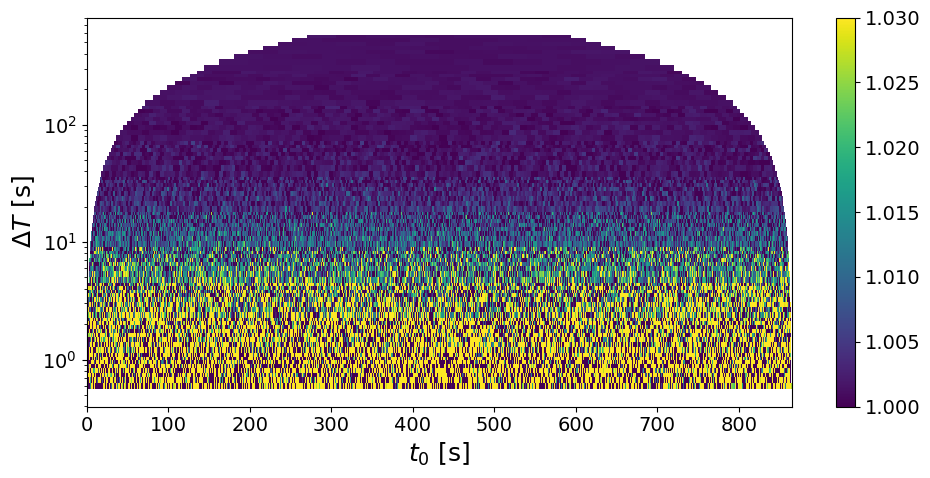

In [18]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,5.726666,0.118771,2.074006,0.750899,0.011293,1.503989,0.030772,0.000367,1.191715,1.001261,0.000011,0.001094,0.946048


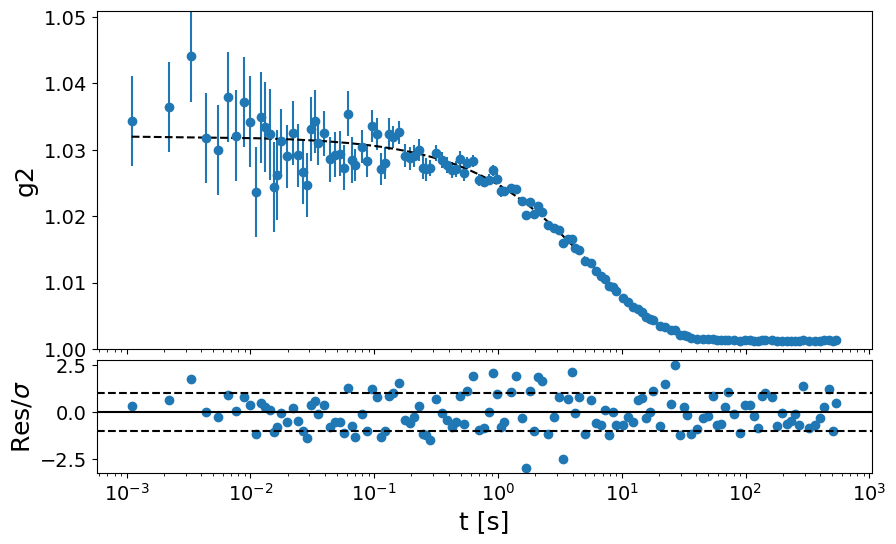

In [19]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=100C, Q=0.19, 25min @ 1ms ON dp (GeO2_3, dataset 1, scan 4)

In [20]:
#######################################
sample_name = 'GeO2_3_100C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



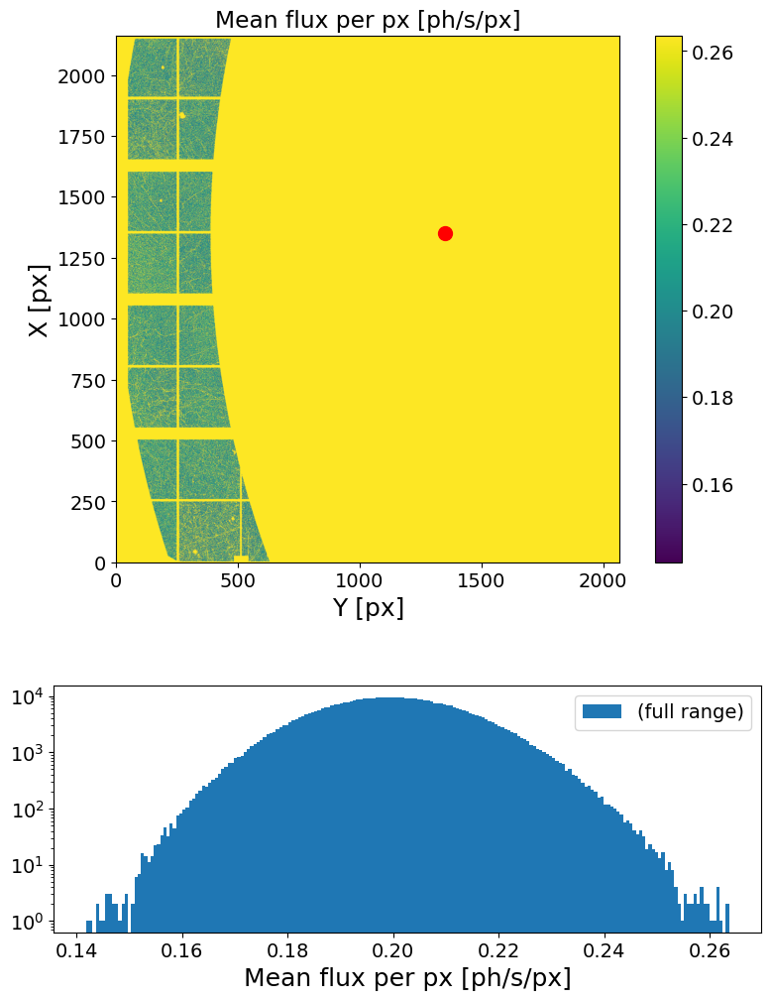

In [21]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [22]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

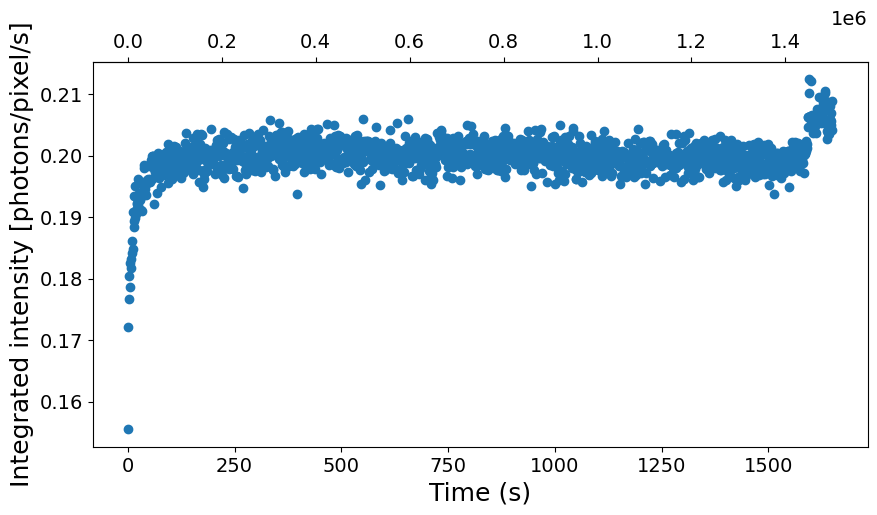

In [23]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [24]:
##### INPUTS #####
Nfi = int(.5e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1499424 => (Nff-Nfi) = 61*2^sparse_depth, thrown frames = 816 (0.08%)
Loading frames ...
Done! (elapsed time = 3.37 s)
	 | 999424 frames X 523950 pixels
	 | sparsity = 2.20e-04
	 | memory usage (sparse.csr_array @ float32) = 1.296 GB
Computing sparse multitau G2t...


100%|██████████| 61/61 [02:05<00:00,  2.06s/it]


Done! (elapsed time = 125.61 s)
Computing dense multitau G2t...
	-> computing channels on 488 frames ...
	-> computing channels on 244 frames ...
	-> computing channels on 122 frames ...
	-> computing channels on 61 frames ...
	-> computing channels on 30 frames ...
Done! (elapsed time = 11.56 s)


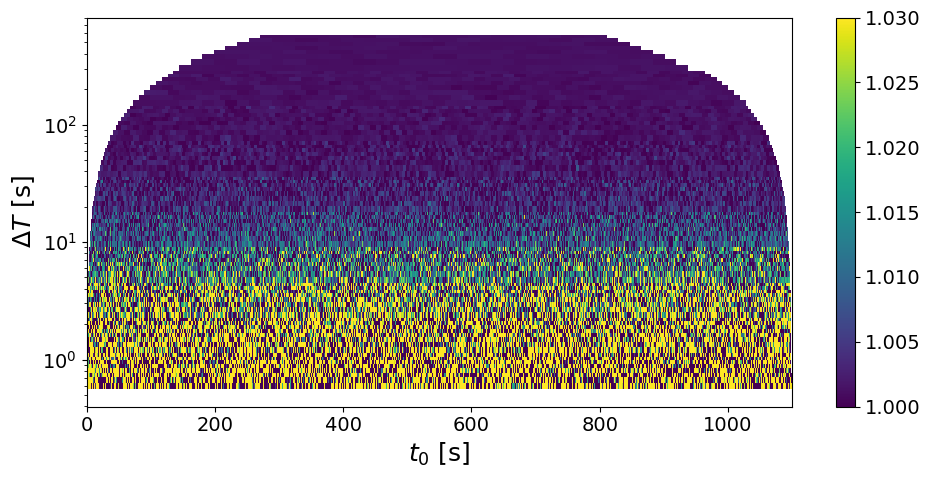

In [25]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,5.329777,0.134131,2.516635,0.748286,0.013624,1.820724,0.029414,0.000424,1.441851,1.001244,0.000012,0.0012,1.305341


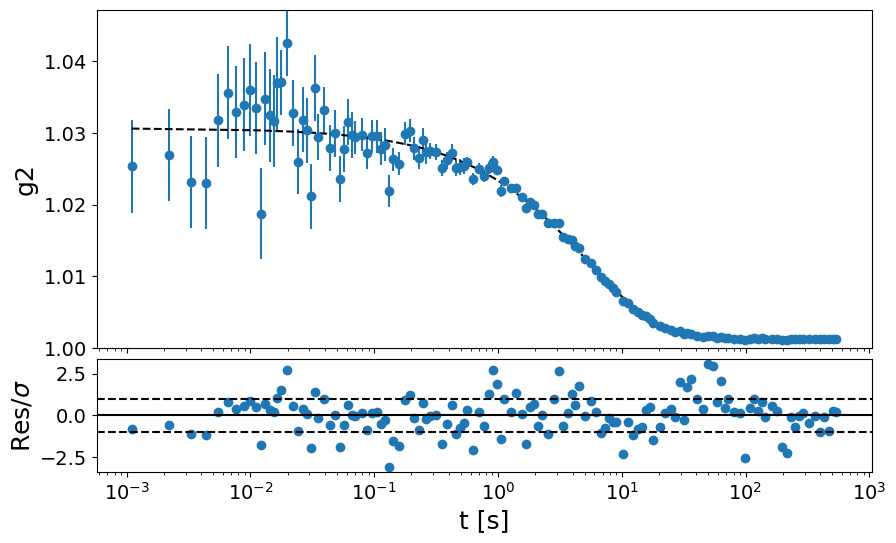

In [26]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=170C, Q=0.19, 25min @ 1ms ON dp (GeO2_3_170C, dataset 1, scan 4)

In [27]:
#######################################
sample_name = 'GeO2_3_170C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



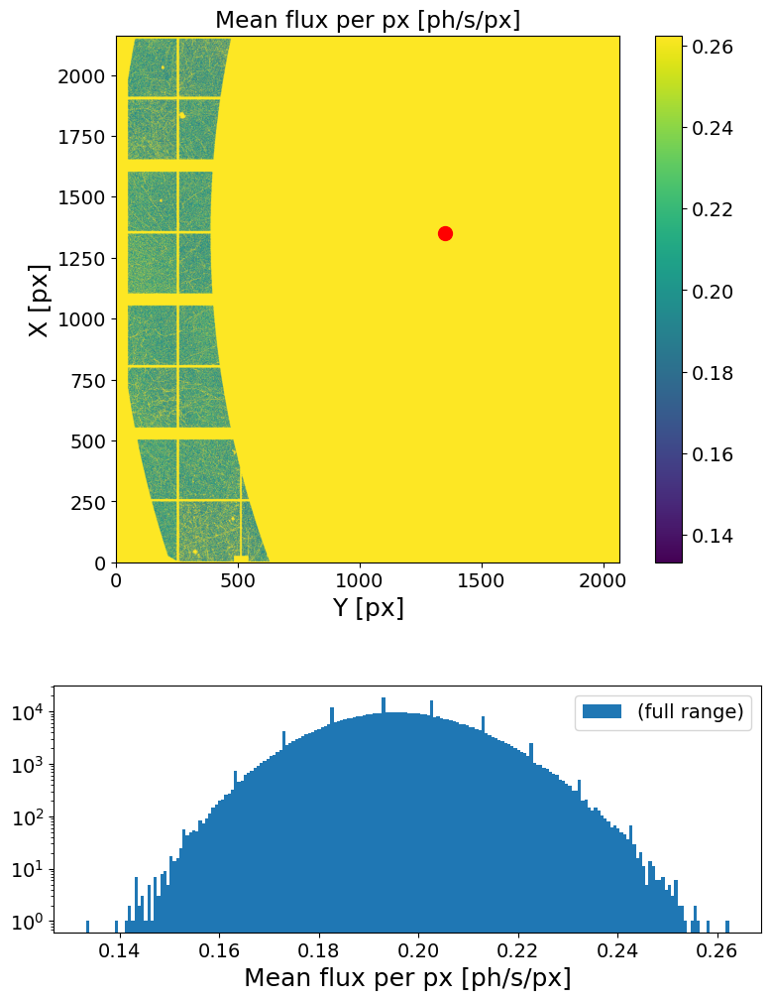

In [28]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [29]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

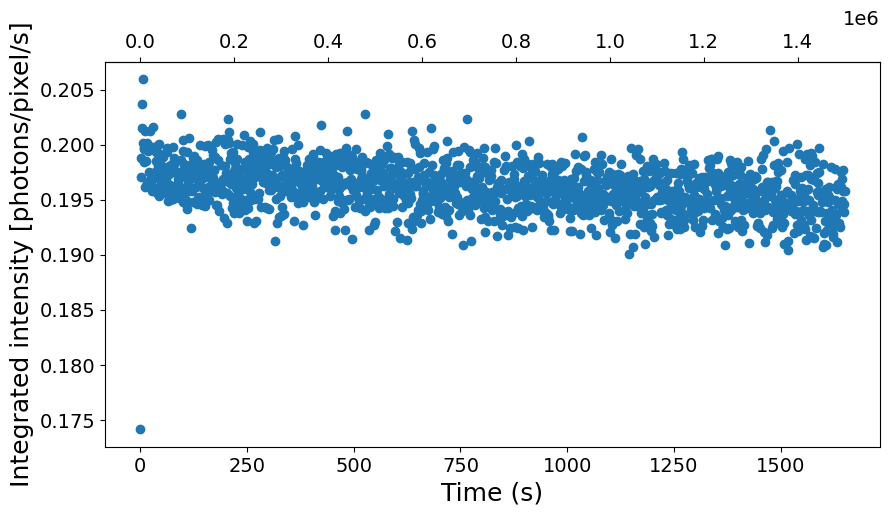

In [30]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [31]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1494336 => (Nff-Nfi) = 79*2^sparse_depth, thrown frames = 5904 (0.45%)
Loading frames ...
Done! (elapsed time = 2.91 s)
	 | 1294336 frames X 523950 pixels
	 | sparsity = 2.15e-04
	 | memory usage (sparse.csr_array @ float32) = 1.642 GB
Computing sparse multitau G2t...


100%|██████████| 79/79 [02:14<00:00,  1.71s/it]


Done! (elapsed time = 134.96 s)
Computing dense multitau G2t...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 11.69 s)


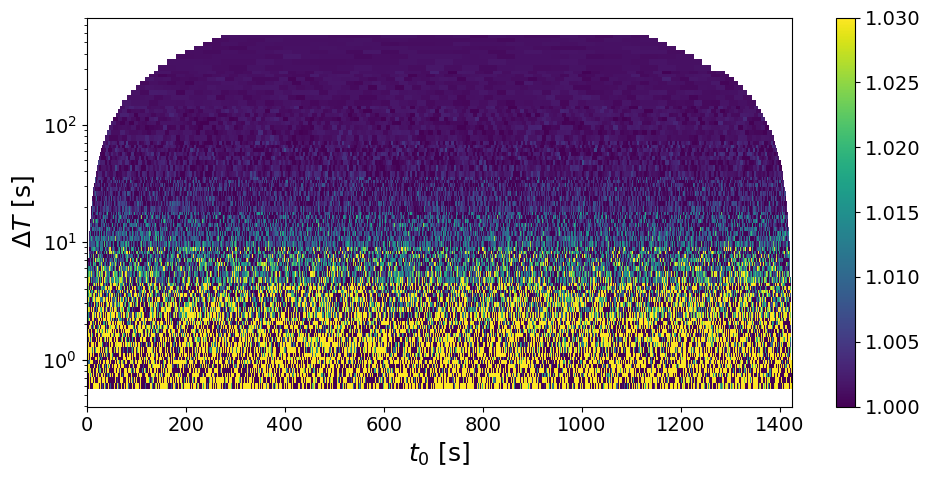

In [32]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,4.468481,0.11871,2.656598,0.710698,0.012547,1.76542,0.029714,0.000436,1.467118,1.00124,0.000008,0.000812,1.344277


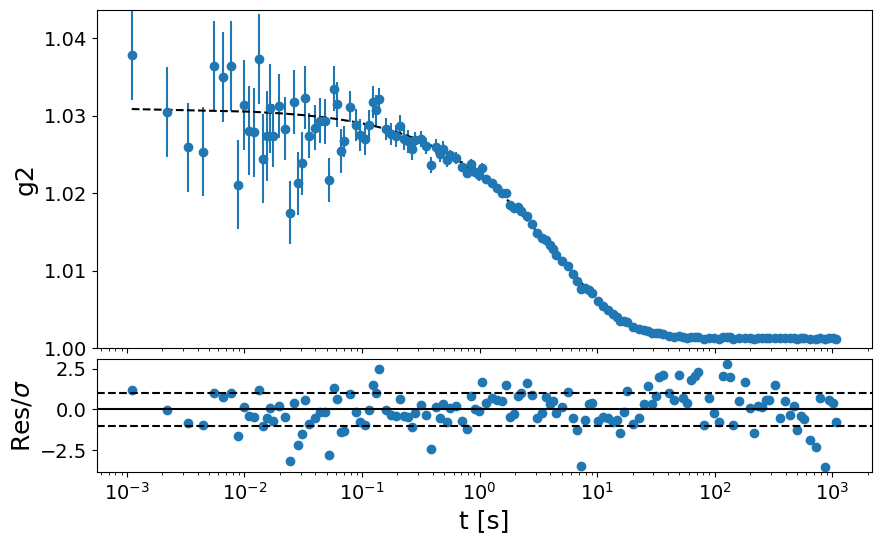

In [33]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=240C, Q=0.19, 25min @ 1ms ON dp (GeO2_3_240C, dataset 1, scan 4)

In [34]:
#######################################
sample_name = 'GeO2_3_240C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



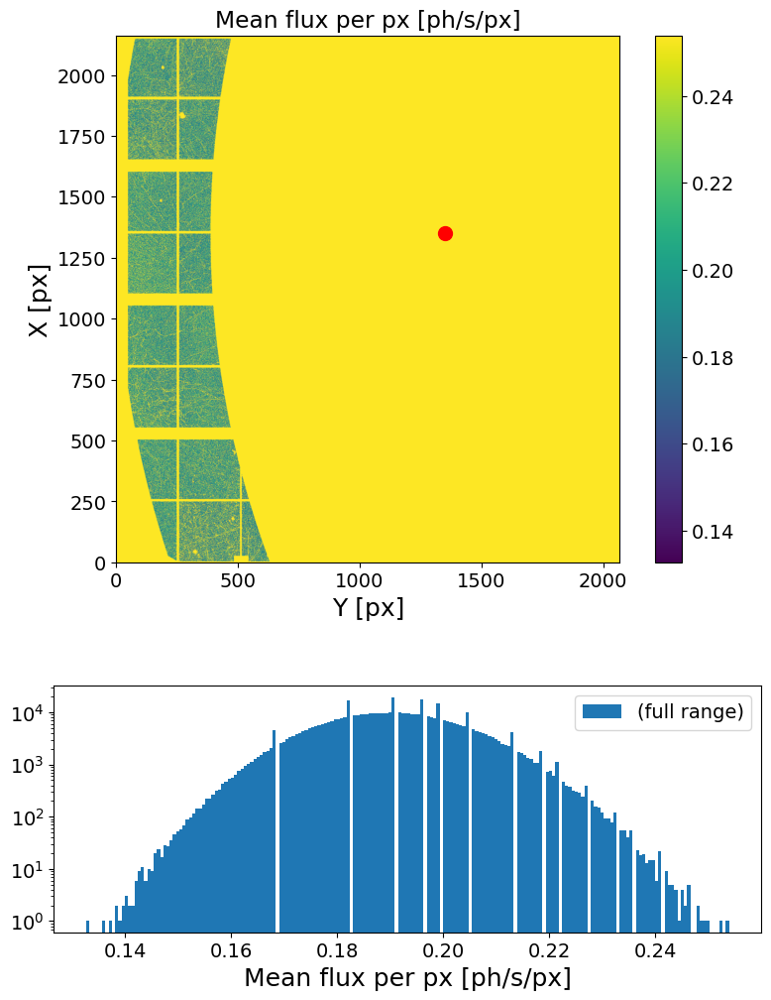

In [35]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [36]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

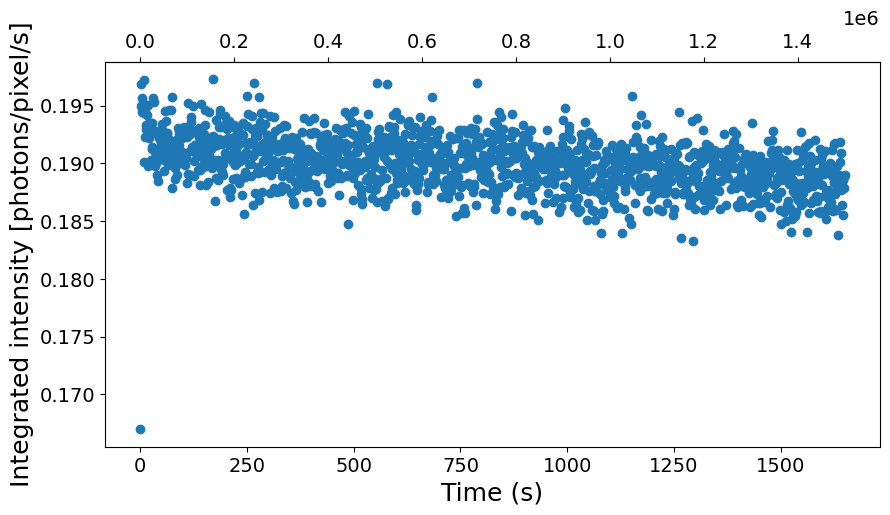

In [37]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [38]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1494336 => (Nff-Nfi) = 79*2^sparse_depth, thrown frames = 5904 (0.45%)
Loading frames ...
Done! (elapsed time = 2.7 s)
	 | 1294336 frames X 523950 pixels
	 | sparsity = 2.09e-04
	 | memory usage (sparse.csr_array @ float32) = 1.592 GB
Computing sparse multitau G2t...


100%|██████████| 79/79 [03:21<00:00,  2.55s/it]


Done! (elapsed time = 201.79 s)
Computing dense multitau G2t...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 18.43 s)


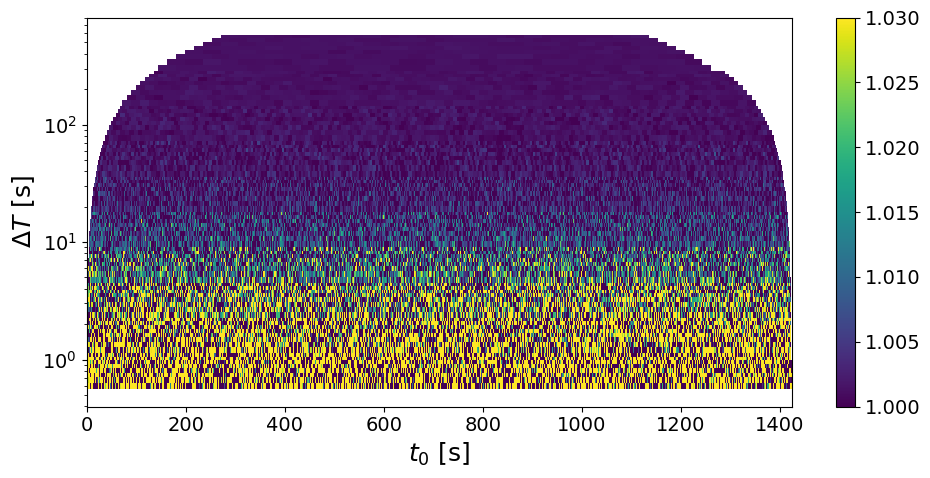

In [39]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,3.960483,0.124255,3.13736,0.722323,0.015447,2.138547,0.028426,0.000497,1.748461,1.001245,0.000008,0.000834,1.48537


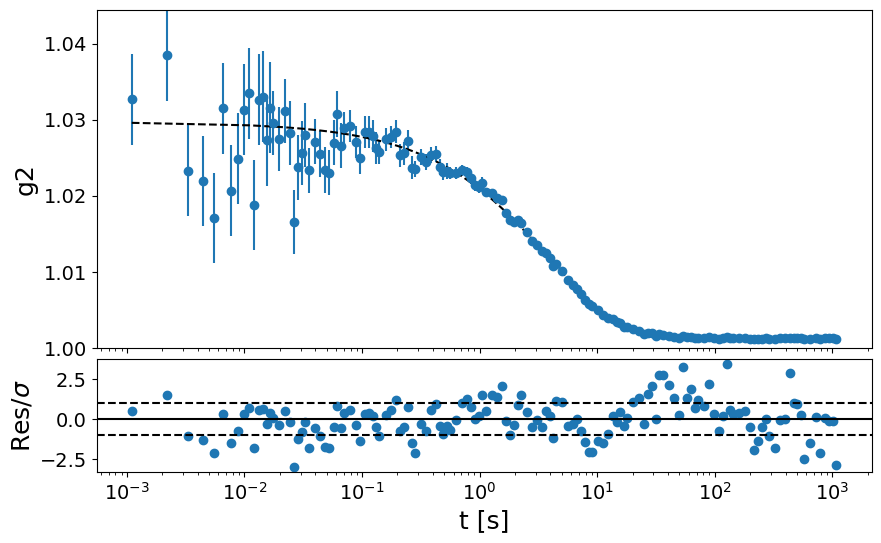

In [40]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=310C, Q=0.19, 25min @ 1ms ON dp (GeO2_3_310C, dataset 1, scan 4)

In [41]:
#######################################
sample_name = 'GeO2_3_310C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



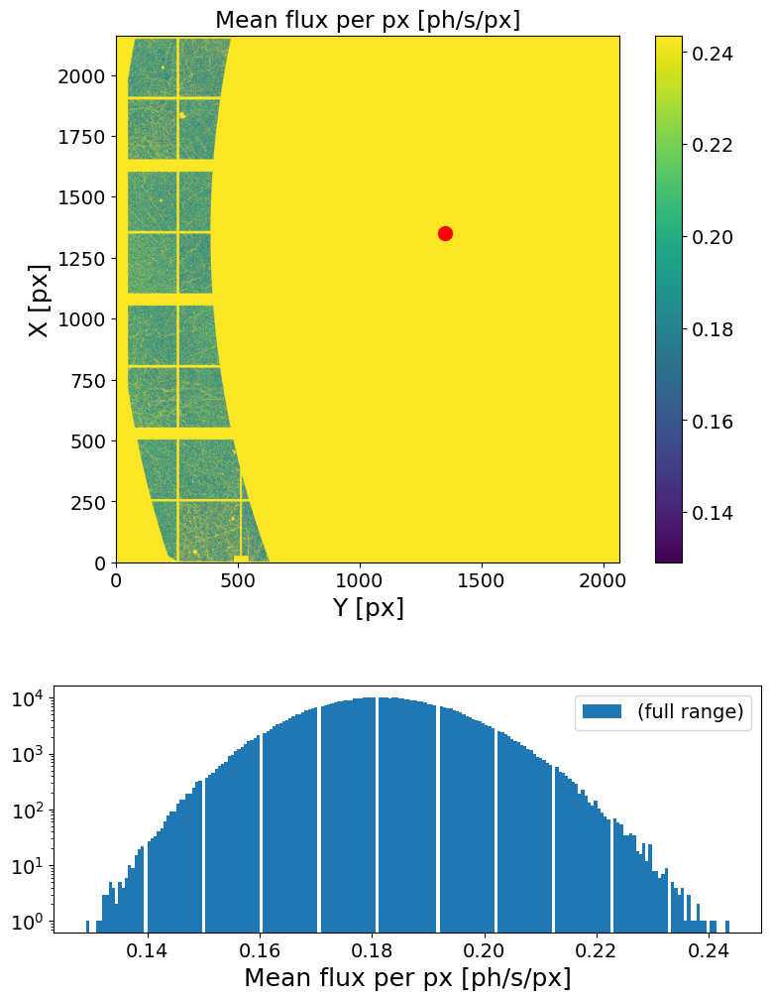

In [42]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [43]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

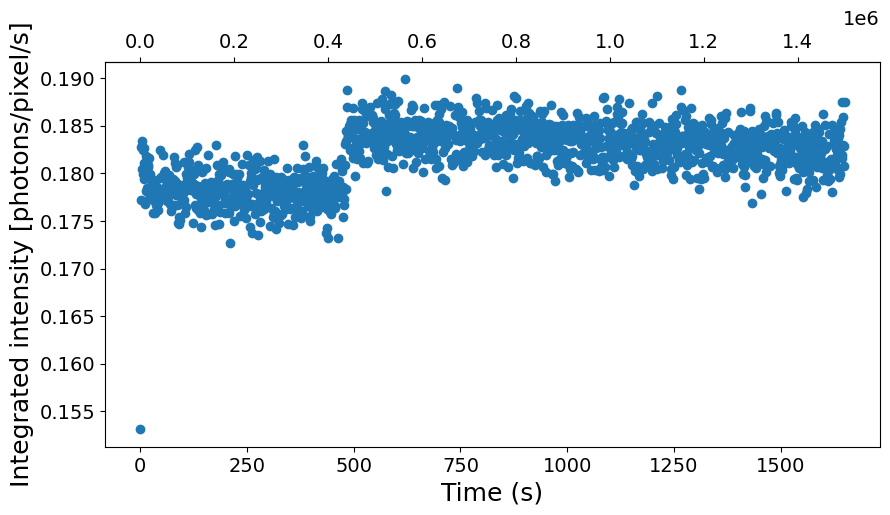

In [44]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [45]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1494336 => (Nff-Nfi) = 79*2^sparse_depth, thrown frames = 5904 (0.45%)
Loading frames ...
Done! (elapsed time = 3.08 s)
	 | 1294336 frames X 523950 pixels
	 | sparsity = 2.01e-04
	 | memory usage (sparse.csr_array @ float32) = 1.53 GB
Computing sparse multitau G2t...


100%|██████████| 79/79 [03:04<00:00,  2.33s/it]


Done! (elapsed time = 184.48 s)
Computing dense multitau G2t...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 12.14 s)


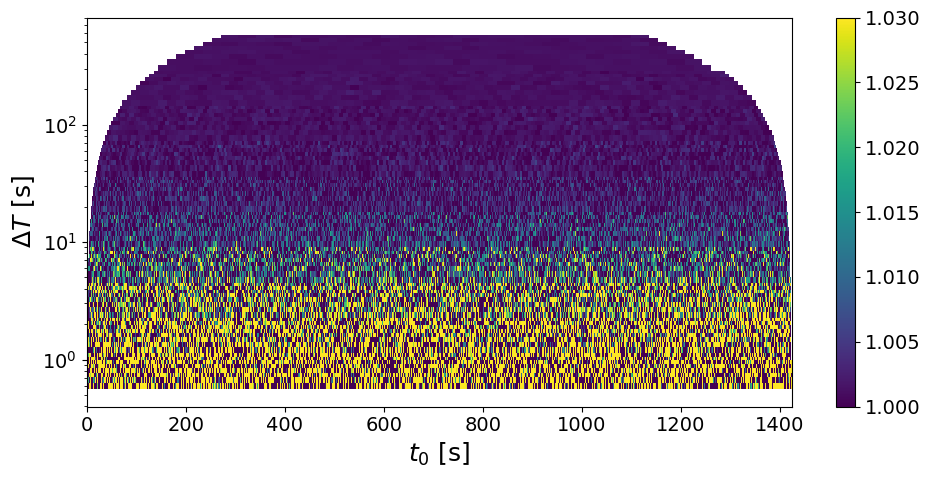

In [46]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,3.45269,0.103394,2.994592,0.722229,0.014675,2.031941,0.027635,0.000461,1.669404,1.001244,0.000008,0.000798,1.032727


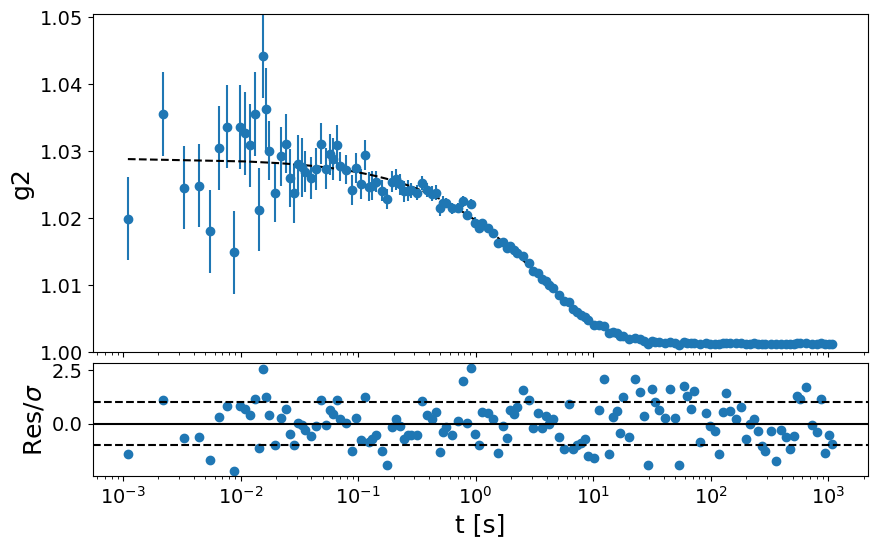

In [47]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=380C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_380C, dataset 1, scan 4)

In [48]:
#######################################
sample_name = 'GeO2_3_380C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



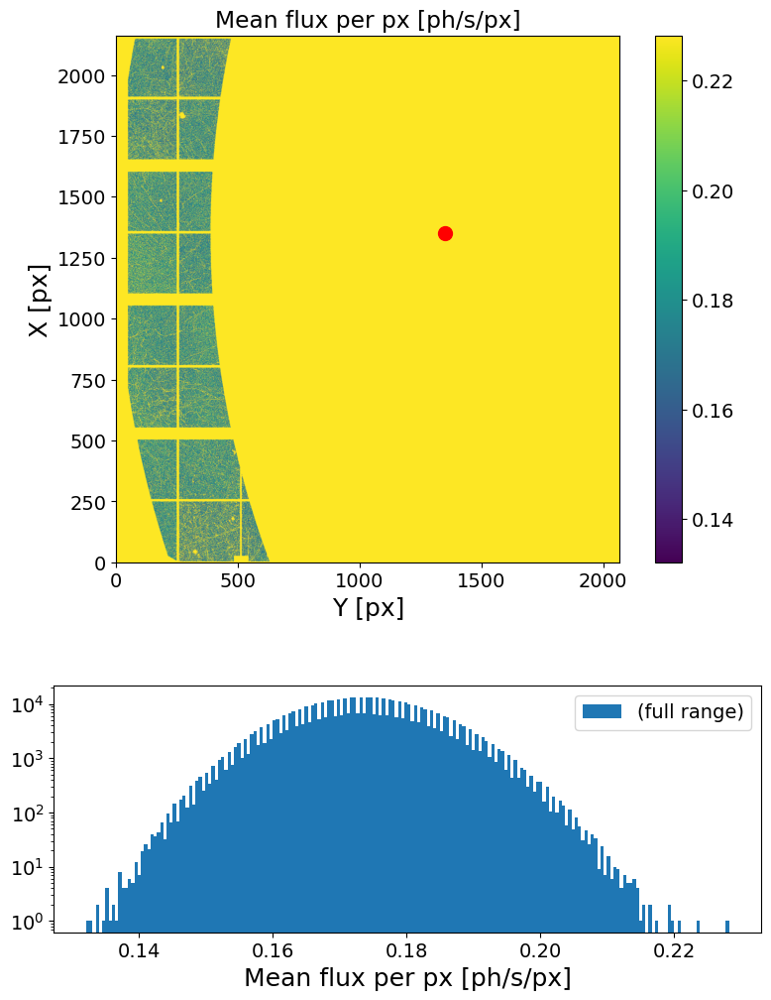

In [49]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [50]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

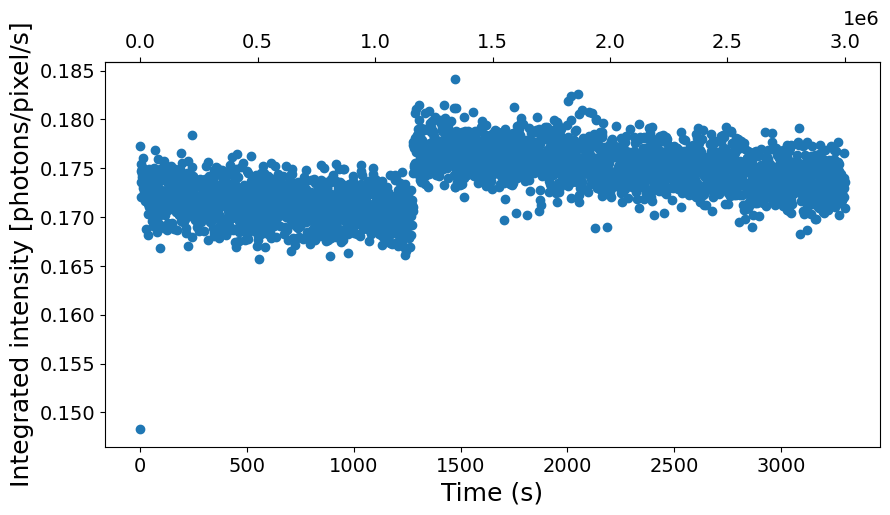

In [51]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [52]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2985280 => (Nff-Nfi) = 170*2^sparse_depth, thrown frames = 14288 (0.51%)
Loading frames ...
Done! (elapsed time = 4.2 s)
	 | 2785280 frames X 523950 pixels
	 | sparsity = 1.91e-04
	 | memory usage (sparse.csr_array @ float32) = 3.14 GB
Computing sparse multitau G2t...


100%|██████████| 170/170 [07:11<00:00,  2.54s/it]


Done! (elapsed time = 431.83 s)
Computing dense multitau G2t...
	-> computing channels on 1360 frames ...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 34.17 s)


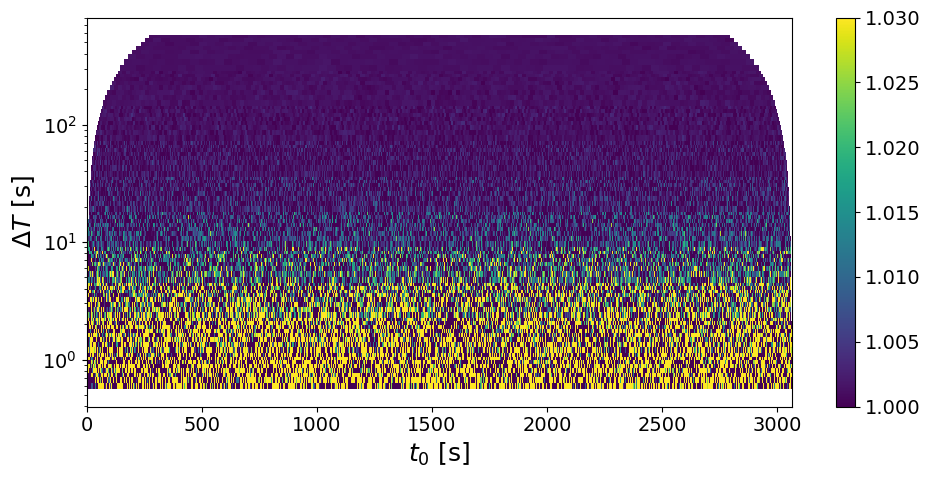

In [53]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,2.786834,0.085183,3.056606,0.691068,0.013345,1.93103,0.027476,0.000454,1.650781,1.001228,0.000005,0.000451,1.48563


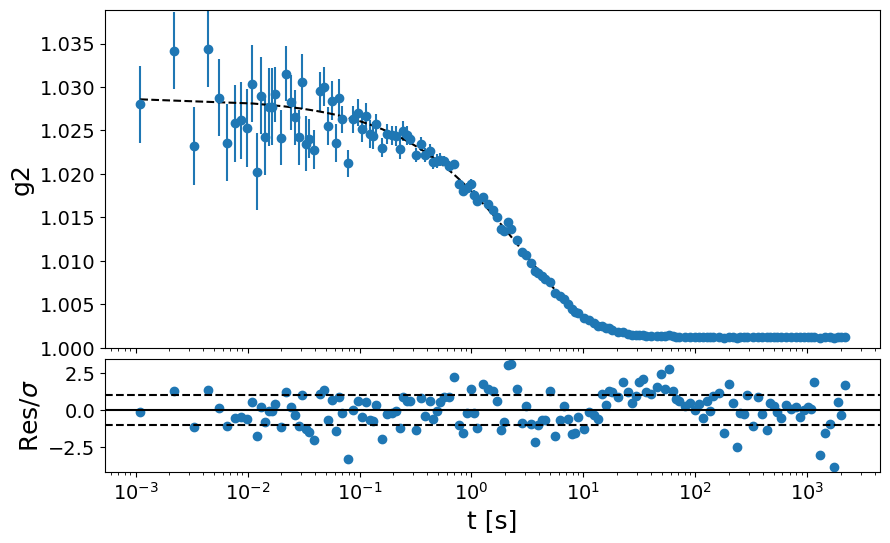

In [54]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=415C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_415C, dataset 1, scan 4)

In [55]:
#######################################
sample_name = 'GeO2_3_415C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/600 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
 eiger4m_v2_sparse_frame_0_00008.h5 (9/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_0000

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



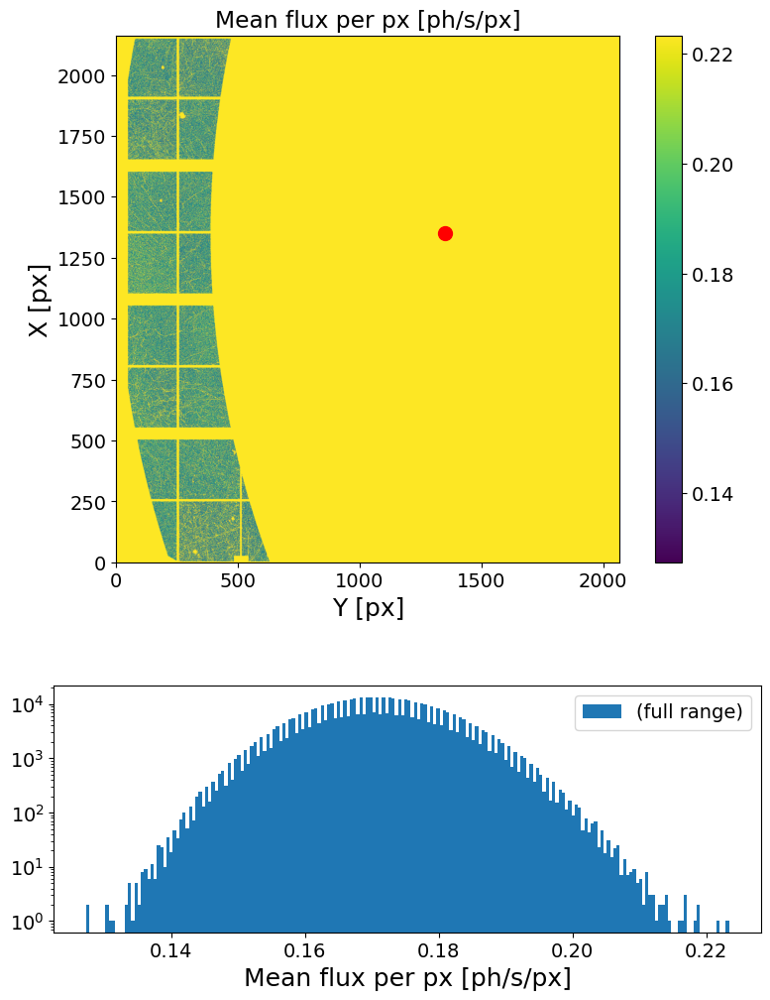

In [56]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [57]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

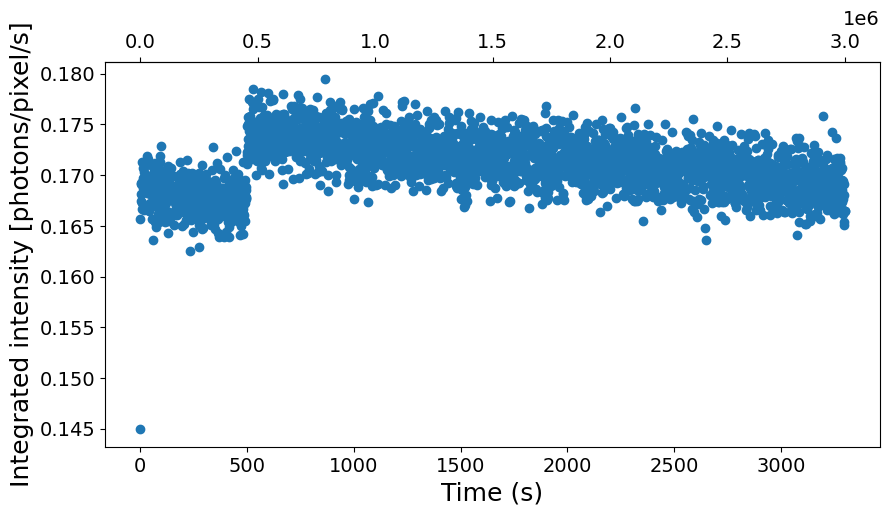

In [58]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [59]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2985280 => (Nff-Nfi) = 170*2^sparse_depth, thrown frames = 14288 (0.51%)
Loading frames ...
Done! (elapsed time = 3.33 s)
	 | 2785280 frames X 523950 pixels
	 | sparsity = 1.88e-04
	 | memory usage (sparse.csr_array @ float32) = 3.091 GB
Computing sparse multitau G2t...


100%|██████████| 170/170 [04:17<00:00,  1.51s/it]


Done! (elapsed time = 257.25 s)
Computing dense multitau G2t...
	-> computing channels on 1360 frames ...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 25.53 s)


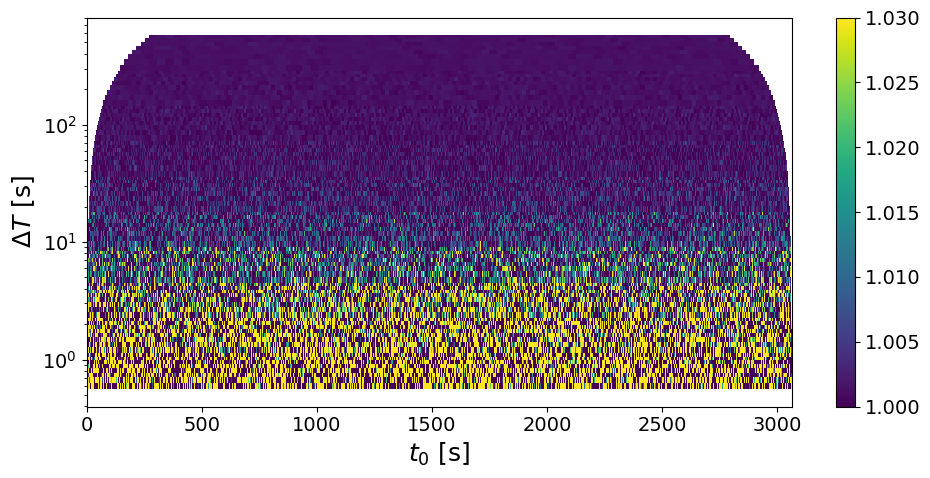

In [60]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,2.629193,0.105385,4.008281,0.631017,0.013874,2.198642,0.027951,0.000568,2.03389,1.001233,0.000005,0.000469,1.886199


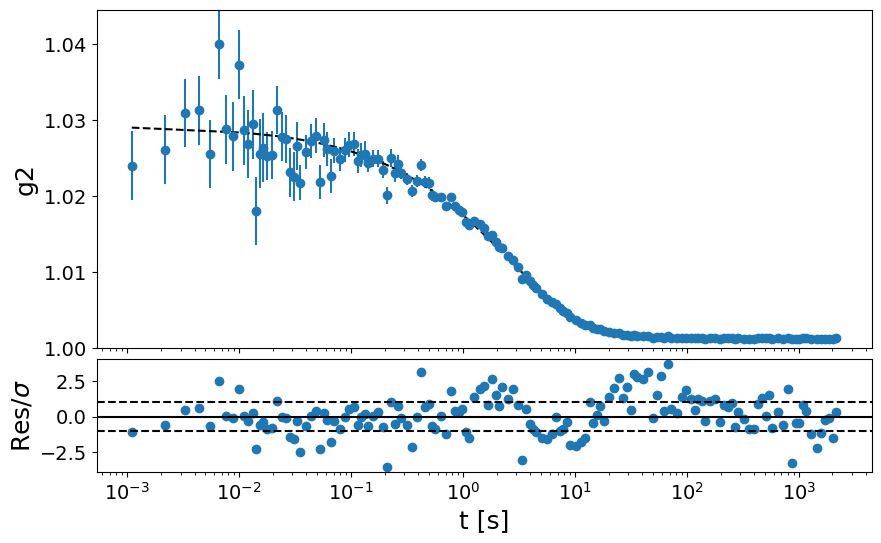

In [61]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=450C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_450C, dataset 1, scan 4)

In [62]:
#######################################
sample_name = 'GeO2_3_450C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00043.h5 (44/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00041.h5 (42/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00036.h5 (37/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00045.h5 (46/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



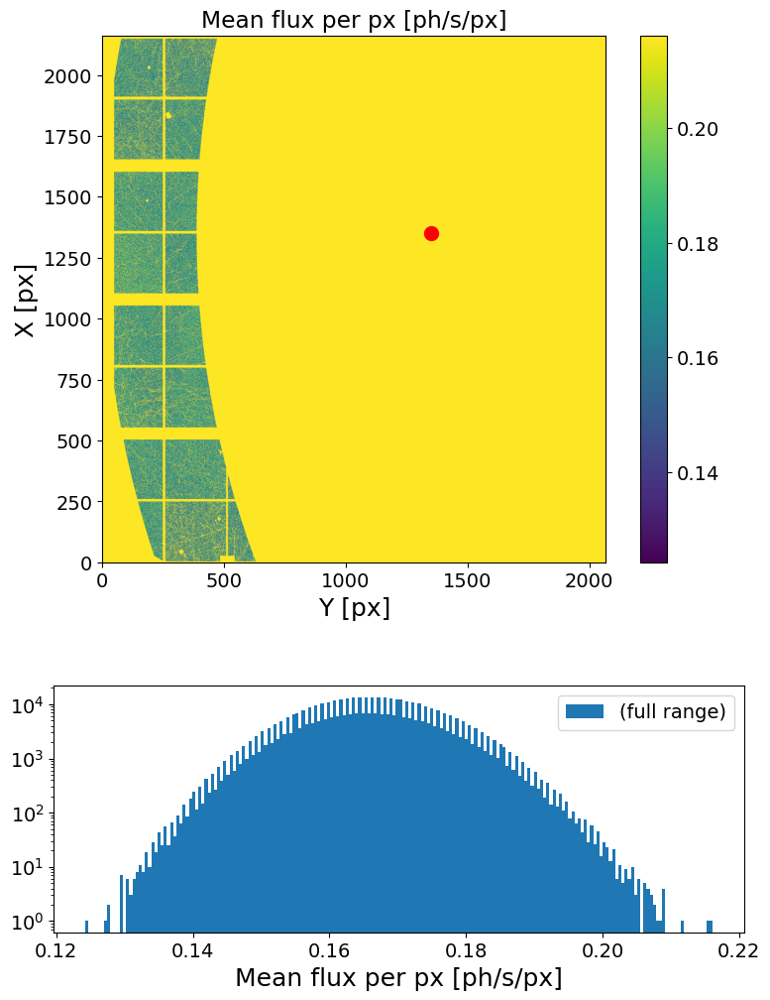

In [63]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [64]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

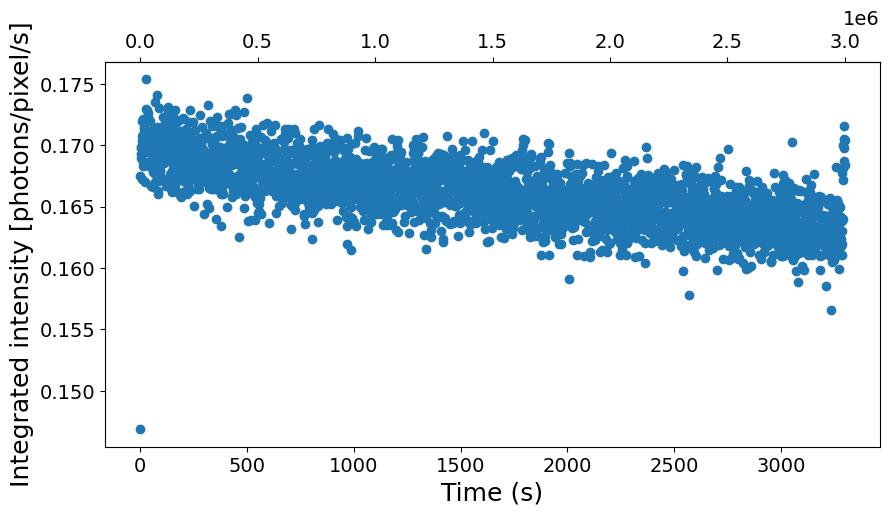

In [65]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [66]:
##### INPUTS #####
Nfi = int(.4e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2988672 => (Nff-Nfi) = 158*2^sparse_depth, thrown frames = 10896 (0.42%)
Loading frames ...
Done! (elapsed time = 5.52 s)
	 | 2588672 frames X 523950 pixels
	 | sparsity = 1.82e-04
	 | memory usage (sparse.csr_array @ float32) = 2.783 GB
Computing sparse multitau G2t...


100%|██████████| 158/158 [05:02<00:00,  1.92s/it]


Done! (elapsed time = 302.65 s)
Computing dense multitau G2t...
	-> computing channels on 1264 frames ...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 29.95 s)


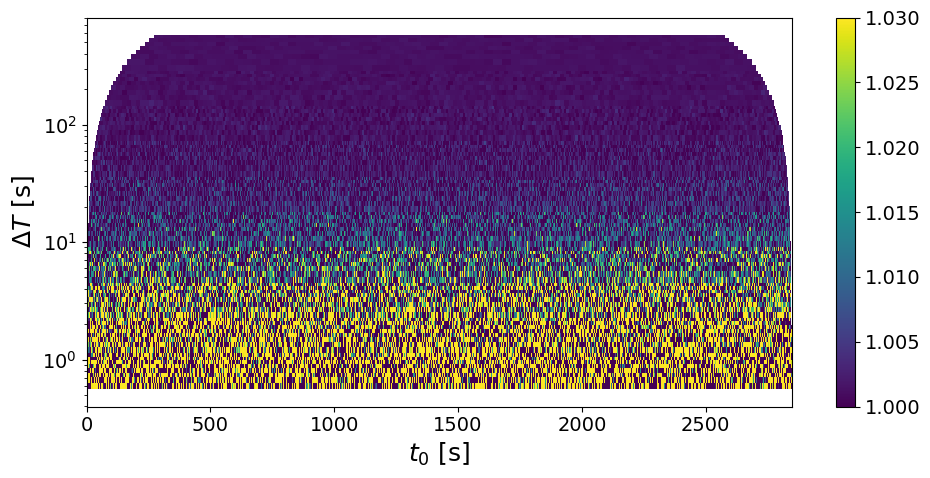

In [67]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,3.456128,0.138283,4.001108,0.595401,0.012001,2.015546,0.027362,0.000535,1.95384,1.001236,0.000006,0.000553,1.767716


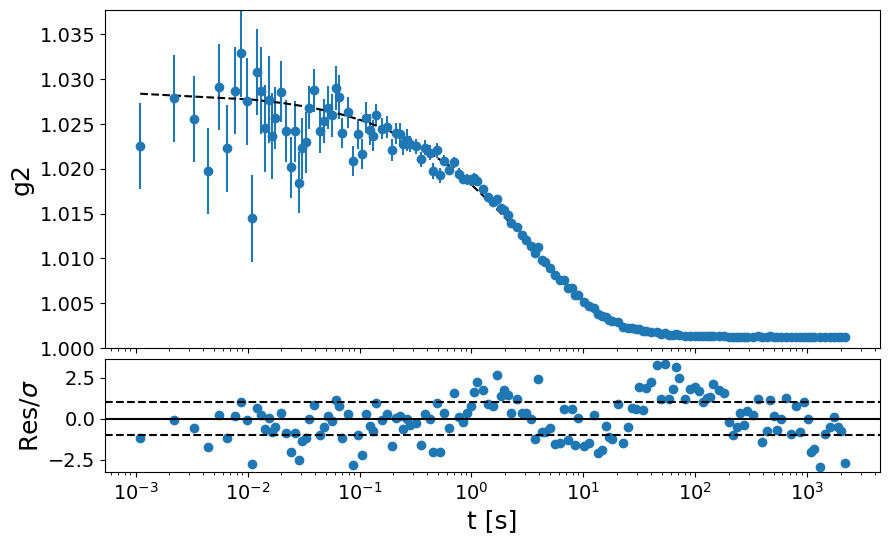

In [68]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=485C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_485C, dataset 1, scan 4)

In [69]:
#######################################
sample_name = 'GeO2_3_485C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



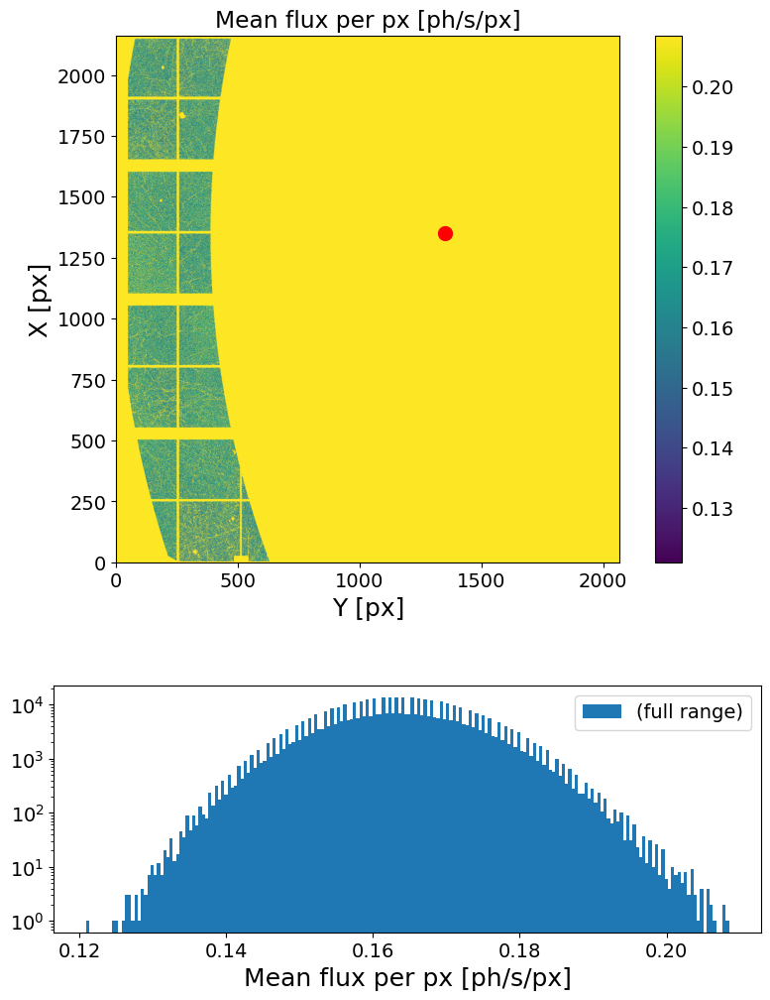

In [70]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [71]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

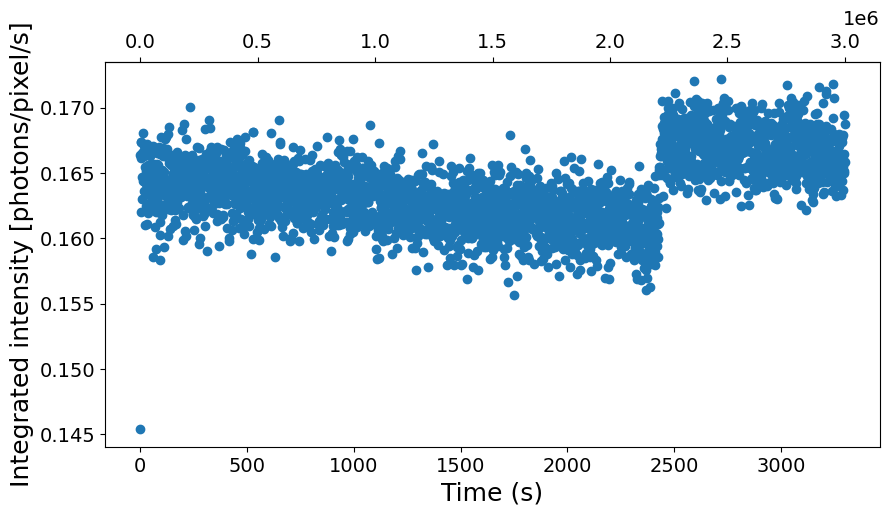

In [72]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [73]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2985280 => (Nff-Nfi) = 170*2^sparse_depth, thrown frames = 14288 (0.51%)
Loading frames ...
Done! (elapsed time = 3.08 s)
	 | 2785280 frames X 523950 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 2.958 GB
Computing sparse multitau G2t...


100%|██████████| 170/170 [05:27<00:00,  1.92s/it]


Done! (elapsed time = 327.14 s)
Computing dense multitau G2t...
	-> computing channels on 1360 frames ...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 31.16 s)


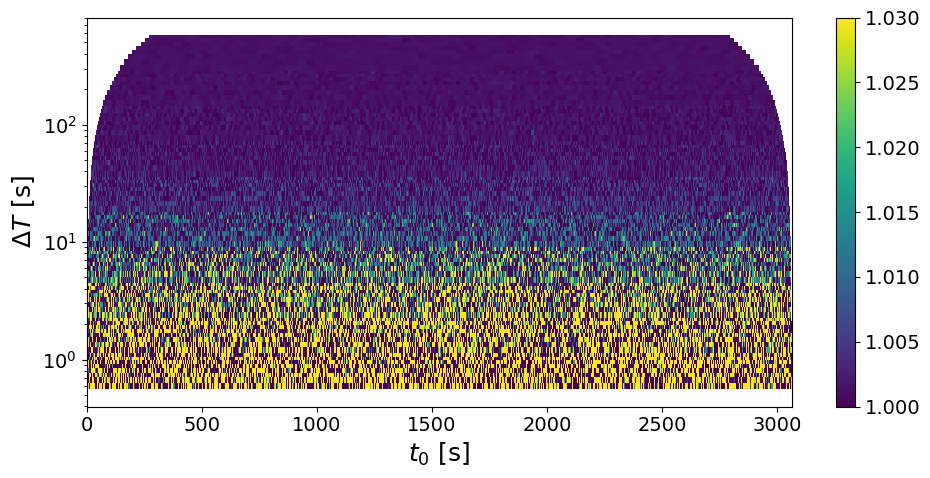

In [74]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,4.326001,0.140756,3.253732,0.618732,0.010746,1.736829,0.026115,0.000426,1.630289,1.001248,0.000005,0.000522,1.550688


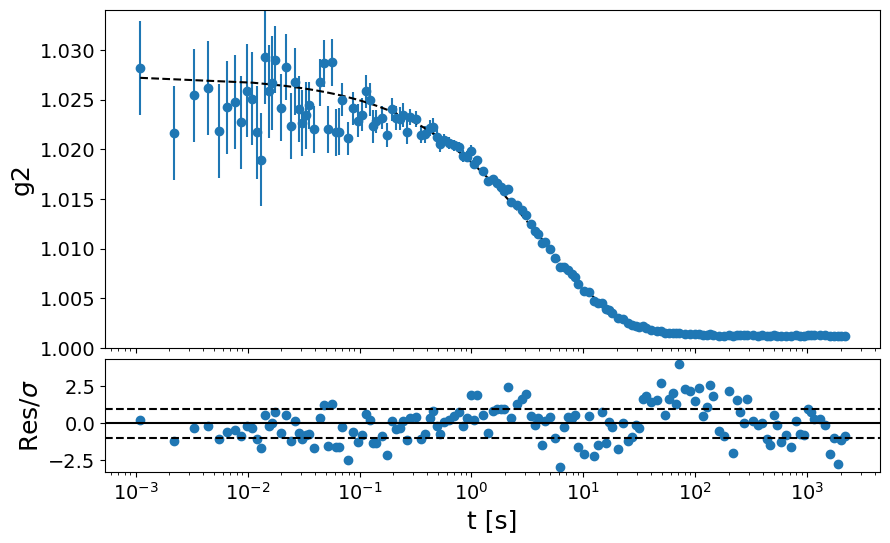

In [75]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=520C, Q=0.19, 110min @ 1ms ON dp (GeO2_3_520C, dataset 1, scan 4)

In [76]:
#######################################
sample_name = 'GeO2_3_520C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, 3_000_000
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 6000048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 110.00 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/601 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_0000

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



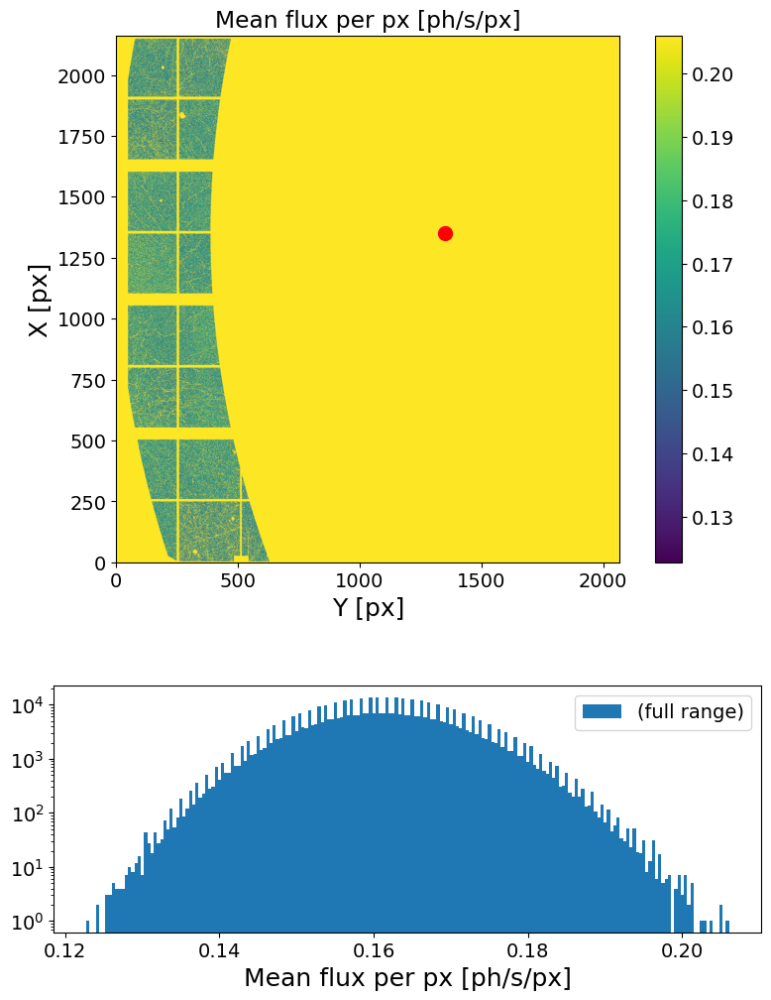

In [77]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [78]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

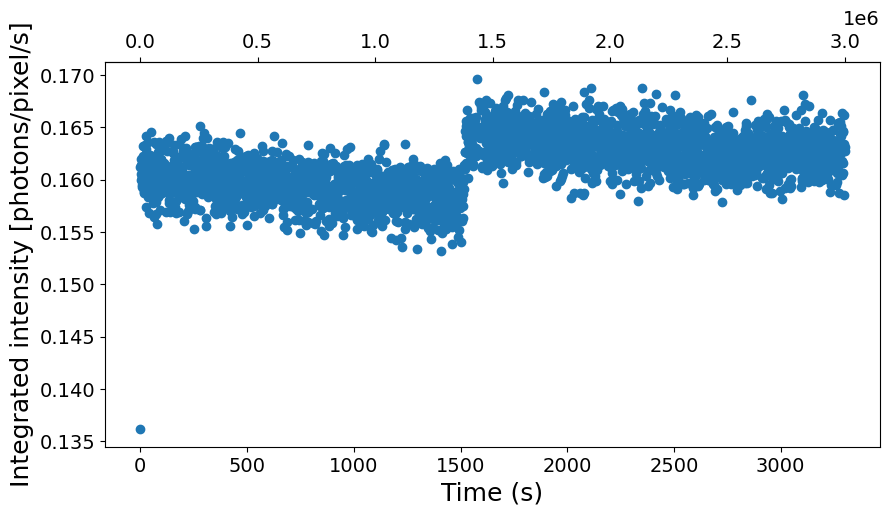

In [79]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [80]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2985280 => (Nff-Nfi) = 170*2^sparse_depth, thrown frames = 14720 (0.53%)
Loading frames ...
Done! (elapsed time = 13.82 s)
	 | 2785280 frames X 523950 pixels
	 | sparsity = 1.78e-04
	 | memory usage (sparse.csr_array @ float32) = 2.917 GB
Computing sparse multitau G2t...


100%|██████████| 170/170 [06:15<00:00,  2.21s/it]


Done! (elapsed time = 375.45 s)
Computing dense multitau G2t...
	-> computing channels on 1360 frames ...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 22.91 s)


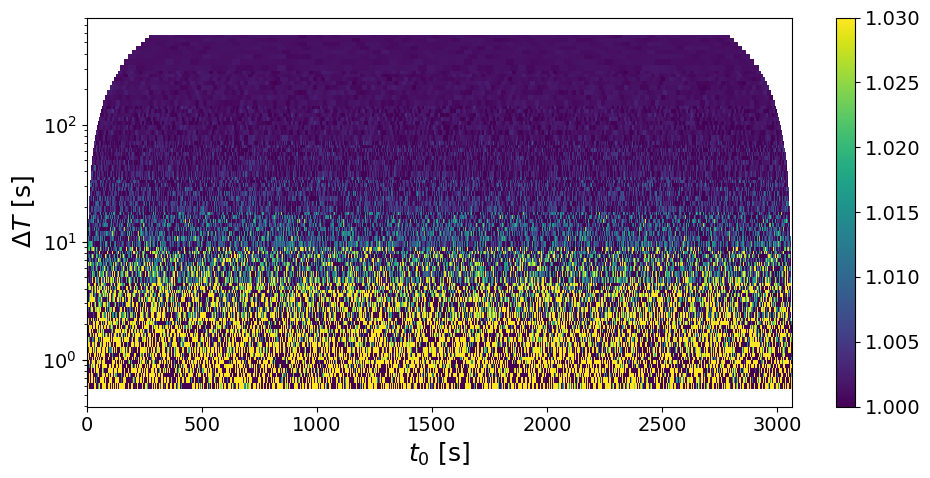

In [81]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,4.180307,0.132068,3.159301,0.63663,0.011239,1.76532,0.025477,0.000411,1.614507,1.001228,0.000005,0.000519,1.412096


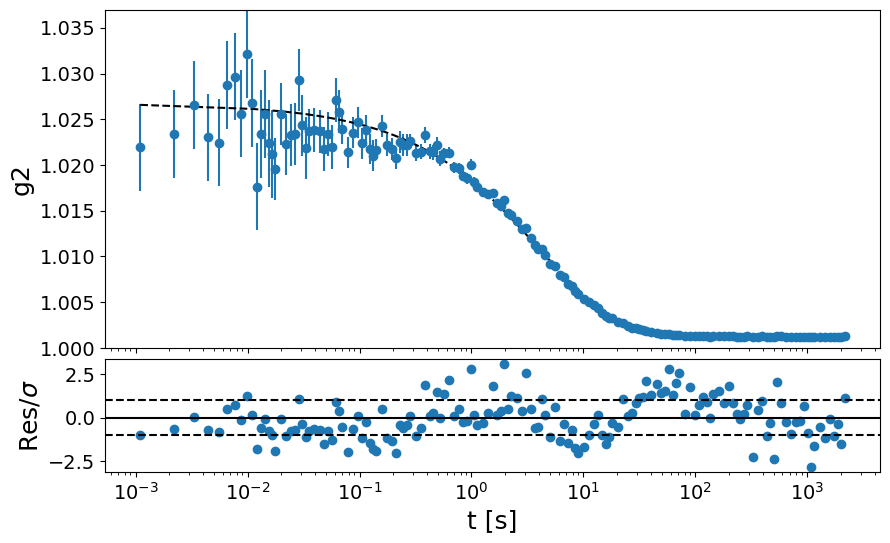

In [82]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=555C, Q=0.19, 110min @ 1ms ON dp (GeO2_3_555C, dataset 1, scan 4)

In [83]:
#######################################
sample_name = 'GeO2_3_555C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None #3_000_000
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 6000048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 110.00 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/1201 loops)
	 -> loading file eiger4m_v2_sparse_fr

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



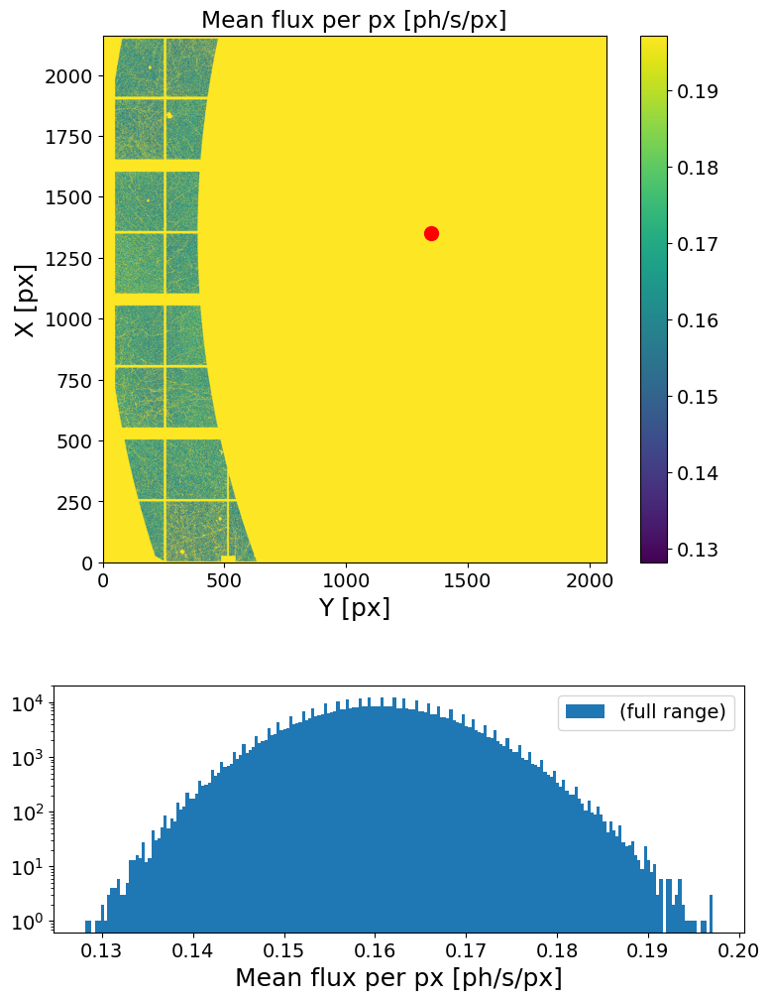

In [84]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [85]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

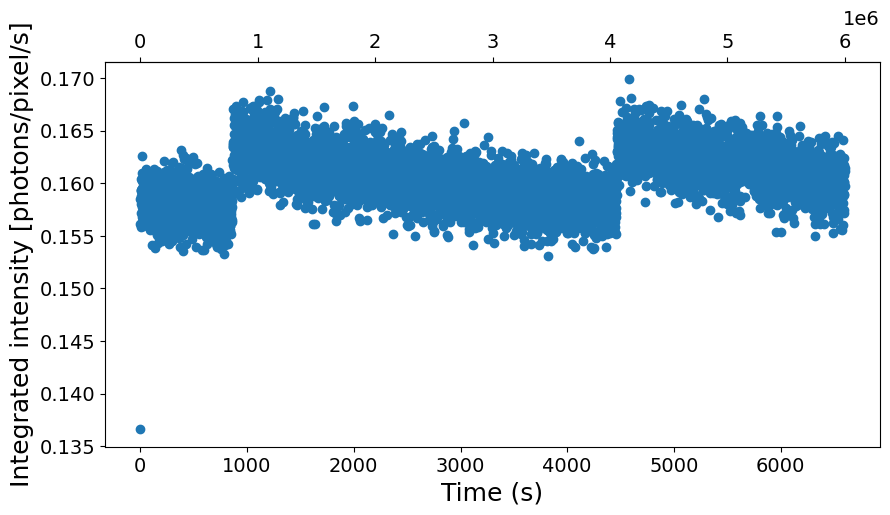

In [86]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [87]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 5999936 => (Nff-Nfi) = 354*2^sparse_depth, thrown frames = 112 (0.0%)
Loading frames ...
Done! (elapsed time = 8.86 s)
	 | 5799936 frames X 523950 pixels
	 | sparsity = 1.77e-04
	 | memory usage (sparse.csr_array @ float32) = 6.044 GB
Computing sparse multitau G2t...


100%|██████████| 354/354 [13:12<00:00,  2.24s/it]


Done! (elapsed time = 792.58 s)
Computing dense multitau G2t...
	-> computing channels on 2832 frames ...
	-> computing channels on 1416 frames ...
	-> computing channels on 708 frames ...
	-> computing channels on 354 frames ...
	-> computing channels on 177 frames ...
	-> computing channels on 88 frames ...
	-> computing channels on 44 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 58.8 s)


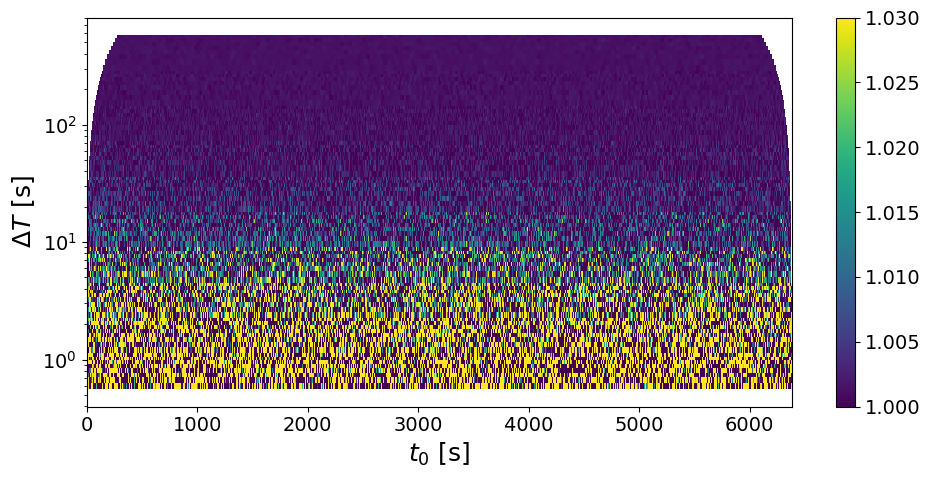

In [88]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,2.913984,0.103246,3.543109,0.626279,0.012021,1.919508,0.02582,0.000461,1.786929,1.001245,0.000003,0.000293,2.502669


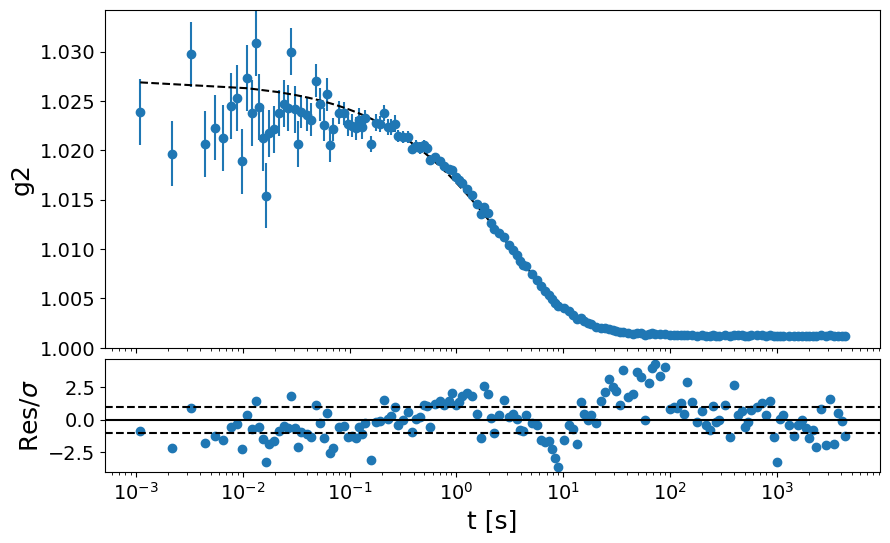

In [89]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=590C, Q=0.19, 110min @ 1ms ON dp (GeO2_3_590C, dataset 1, scan 4)

In [90]:
#######################################
sample_name = 'GeO2_3_590C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 6000048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 110.00 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/1201 loops)
	 -> loading file	 -> loading file  

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



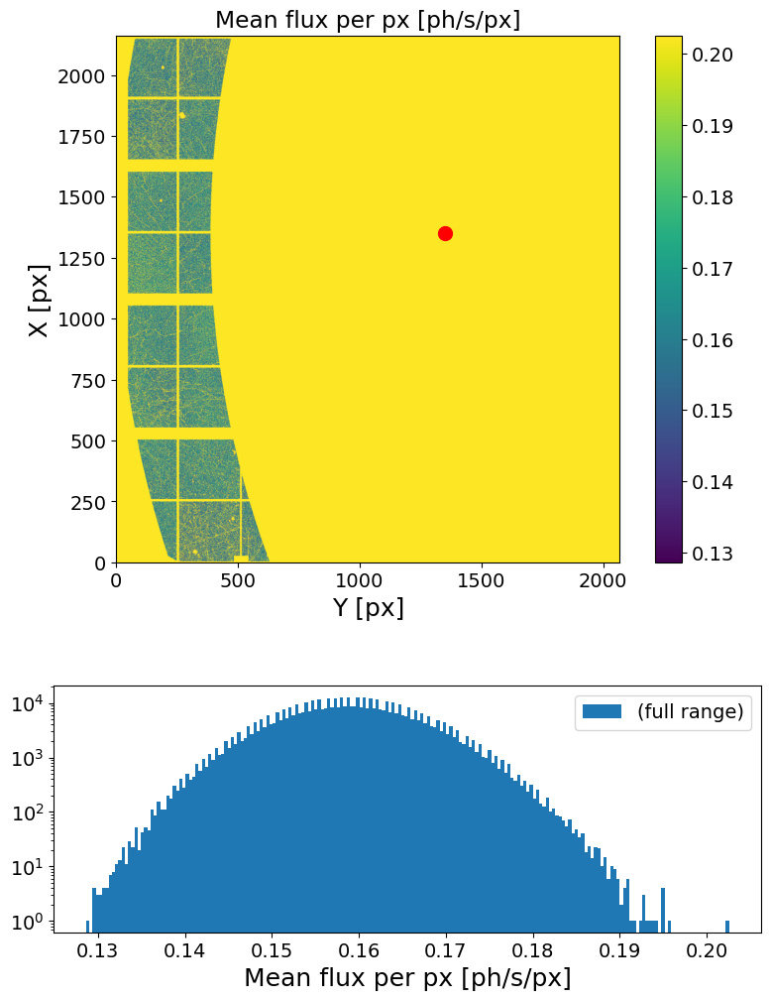

In [91]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [92]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

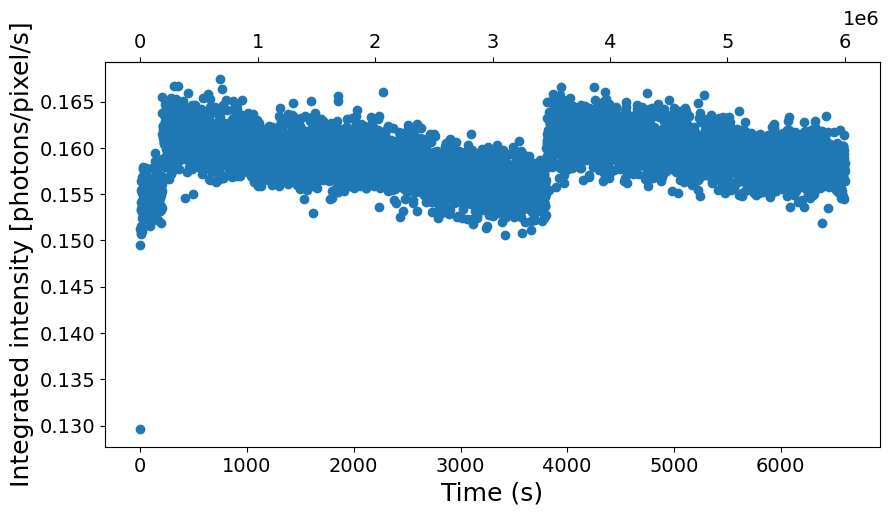

In [93]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [94]:
##### INPUTS #####
Nfi = int(.5e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 5988640 => (Nff-Nfi) = 335*2^sparse_depth, thrown frames = 11408 (0.21%)
Loading frames ...
Done! (elapsed time = 7.96 s)
	 | 5488640 frames X 523950 pixels
	 | sparsity = 1.75e-04
	 | memory usage (sparse.csr_array @ float32) = 5.662 GB
Computing sparse multitau G2t...


100%|██████████| 335/335 [10:29<00:00,  1.88s/it]


Done! (elapsed time = 629.33 s)
Computing dense multitau G2t...
	-> computing channels on 2680 frames ...
	-> computing channels on 1340 frames ...
	-> computing channels on 670 frames ...
	-> computing channels on 335 frames ...
	-> computing channels on 167 frames ...
	-> computing channels on 83 frames ...
	-> computing channels on 41 frames ...
	-> computing channels on 20 frames ...
Done! (elapsed time = 43.93 s)


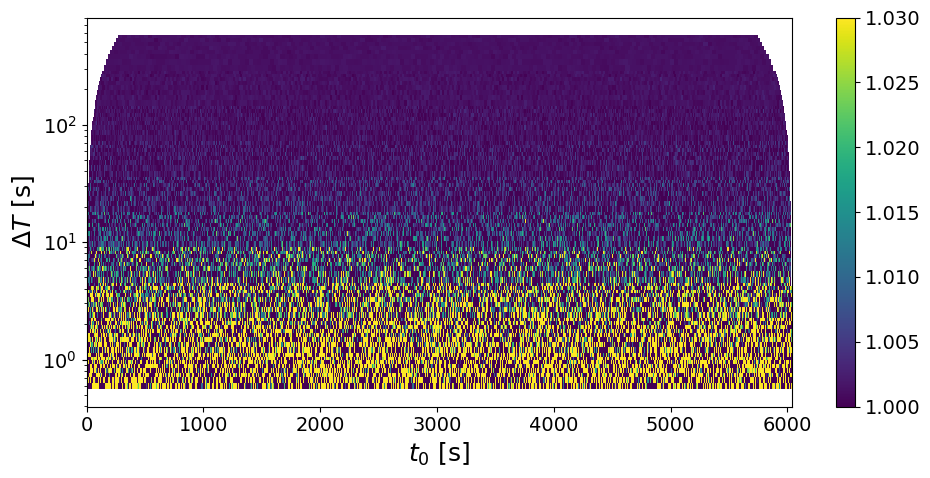

In [95]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,1.618161,0.064791,4.004018,0.63016,0.01379,2.188268,0.02629,0.000534,2.029709,1.001242,0.000003,0.000286,1.733167


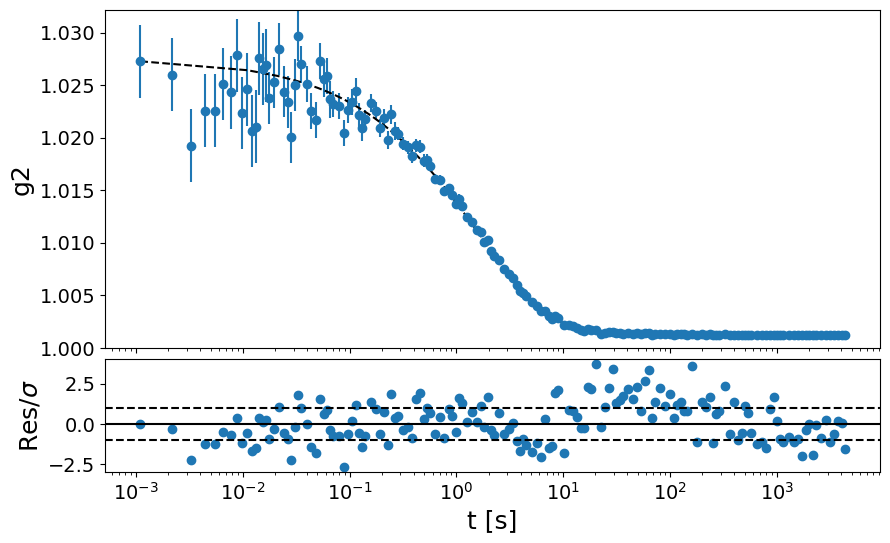

In [96]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=625C, Q=0.19, 160min @ 1ms ON dp (GeO2_3_625C, dataset 1, scan 4)

In [97]:
#######################################
sample_name = 'GeO2_3_625C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 8999616
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 164.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00046.h5 (47/1800 loops)
	 -> loading file	 -> loading file  eiger4m_v2_sparse_frame_0_00018.h5eiger4m_v2_sparse_frame_0_00006.h5 (19/1800 loops) 
(7/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00044.h5 (45/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/1800 loops)
	 -> loading file eiger4m_v2_sparse

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



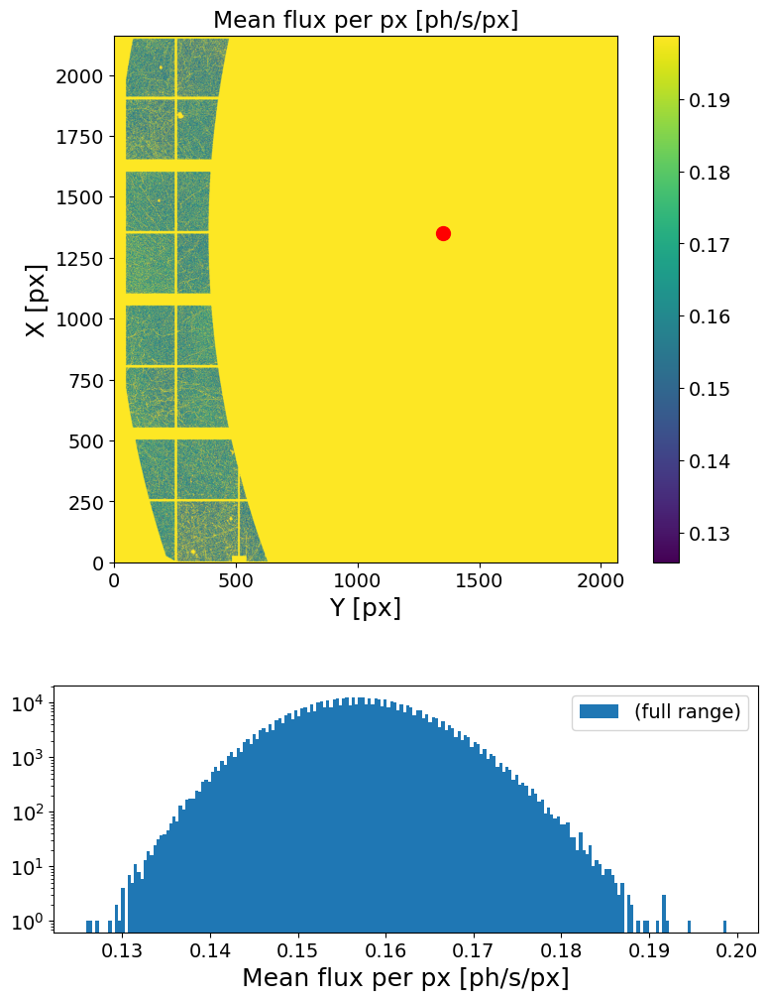

In [98]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [99]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

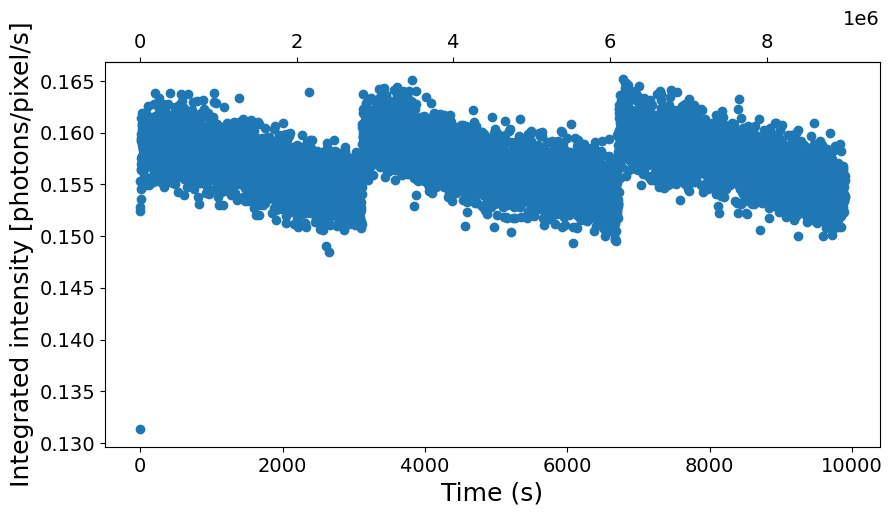

In [100]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [101]:
##### INPUTS #####
Nfi = int(.5e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 8986912 => (Nff-Nfi) = 518*2^sparse_depth, thrown frames = 12704 (0.15%)
Loading frames ...
Done! (elapsed time = 16.93 s)
	 | 8486912 frames X 523950 pixels
	 | sparsity = 1.73e-04
	 | memory usage (sparse.csr_array @ float32) = 8.639 GB
Computing sparse multitau G2t...


100%|██████████| 518/518 [10:54<00:00,  1.26s/it]


Done! (elapsed time = 655.01 s)
Computing dense multitau G2t...
	-> computing channels on 4144 frames ...
	-> computing channels on 2072 frames ...
	-> computing channels on 1036 frames ...
	-> computing channels on 518 frames ...
	-> computing channels on 259 frames ...
	-> computing channels on 129 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 92.72 s)


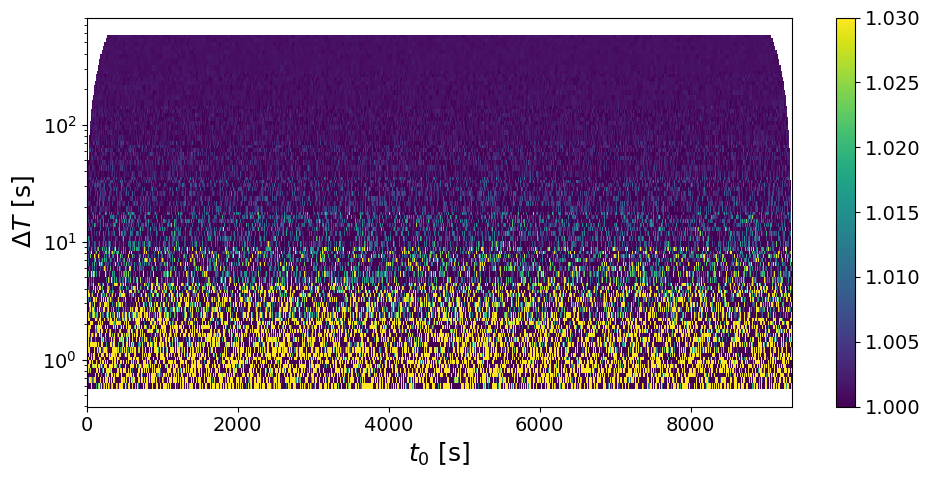

In [102]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,1.001416,0.033455,3.34074,0.703372,0.015203,2.161514,0.023962,0.000437,1.825768,1.001239,0.000002,0.000172,1.253935


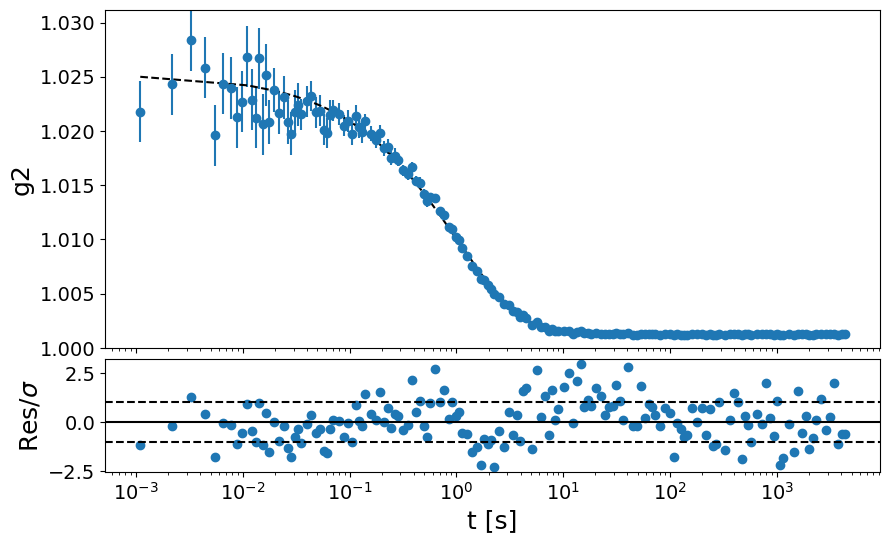

In [103]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=660C, Q=0.19, 44min x 4 @ 1ms ON fp (GeO2_3, dataset 1, scan 4-5-6-7)

In [11]:
#######################################
sample_name = 'GeO2_3_660C'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[3])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 2400384
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 44.01 min
#############################



In [12]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00022.h5 (23/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/481 loops)
	 -> loading file eiger4m_v2_sp

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



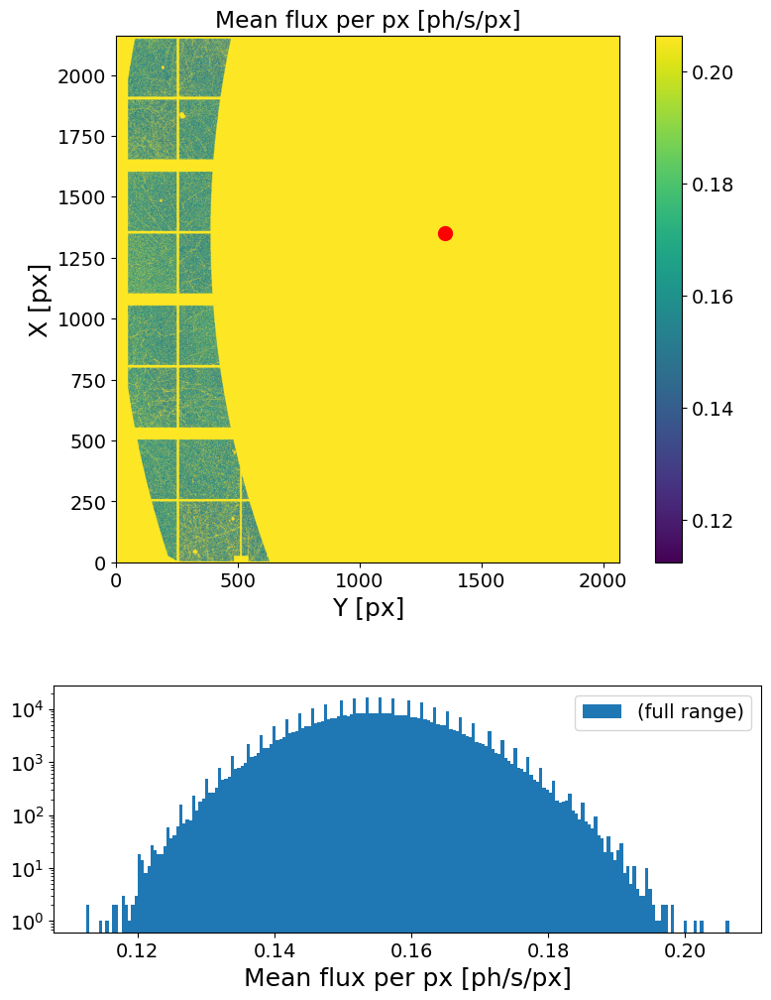

In [13]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

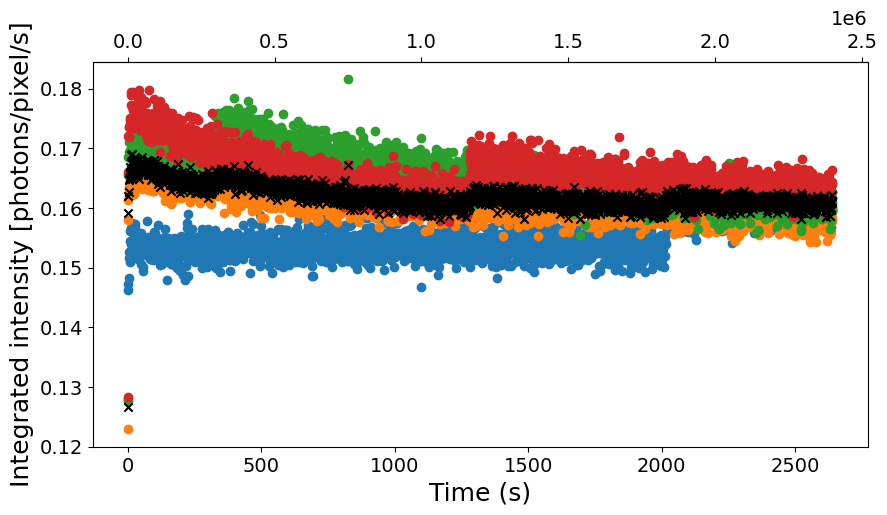

In [14]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep))

    if s==Nscan[0]: It_mean = It
    else:           It_mean[1] += It[1]
    plt.scatter(It[0], It[1], label='It')

It_mean[1] /= len(Nscan)
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It_mean)

plt.scatter(It_mean[0], It_mean[1], label='It mean', color='black', marker='x')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [108]:
##### INPUTS #####
Nfi = int(1e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.35 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.72e-04
	 | memory usage (sparse.csr_array @ float32) = 1.411 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:06<00:00,  1.28it/s]


Done! (elapsed time = 66.67 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 10.93 s)
Processing scan 5...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.55 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.76e-04
	 | memory usage (sparse.csr_array @ float32) = 1.445 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:25<00:00,  1.01s/it]


Done! (elapsed time = 86.02 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 10.61 s)
Processing scan 6...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.06 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 1.473 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:26<00:00,  1.02s/it]


Done! (elapsed time = 86.81 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 11.35 s)
Processing scan 7...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 3.9 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.81e-04
	 | memory usage (sparse.csr_array @ float32) = 1.488 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [02:01<00:00,  1.42s/it]


Done! (elapsed time = 121.13 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 13.84 s)


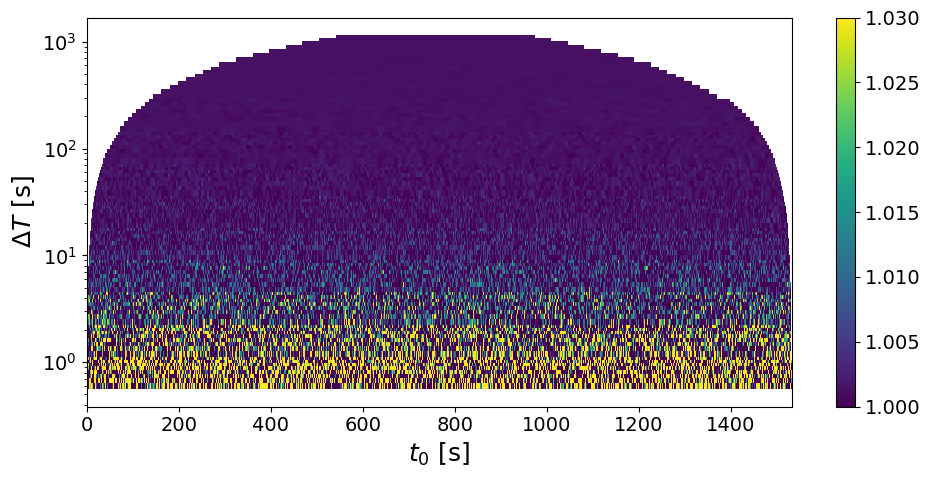

In [109]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.690894,0.040507,5.862931,0.665841,0.023198,3.483943,0.023978,0.00074,3.087509,1.001255,0.000004,0.000448,1.575102


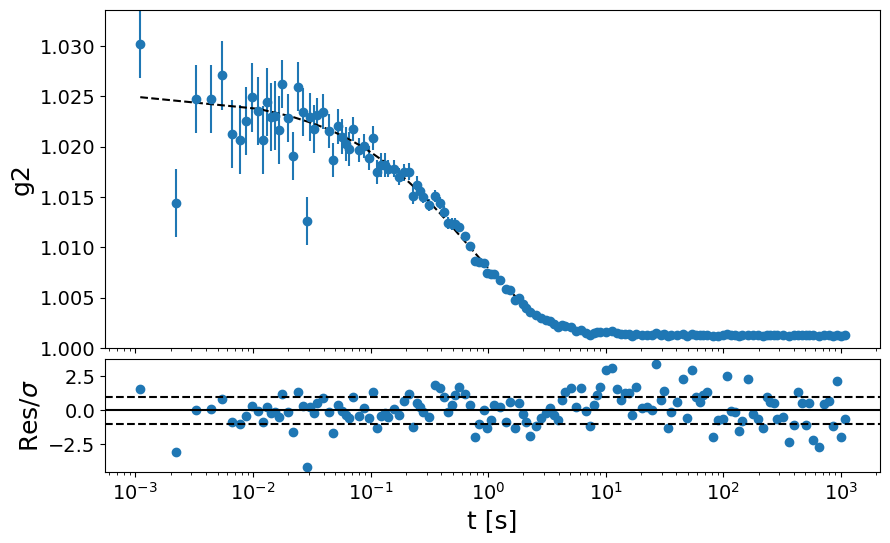

In [110]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=690C, Q=0.19, 40min x 4 @ 1ms ON fp (GeO2_3, dataset 1, scan 4-5-6-7)

In [15]:
#######################################
sample_name = 'GeO2_3_695C'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[3])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 2400384
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 44.01 min
#############################



In [16]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/481 loops)
	 -> loading file eiger4m_v2_spa

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



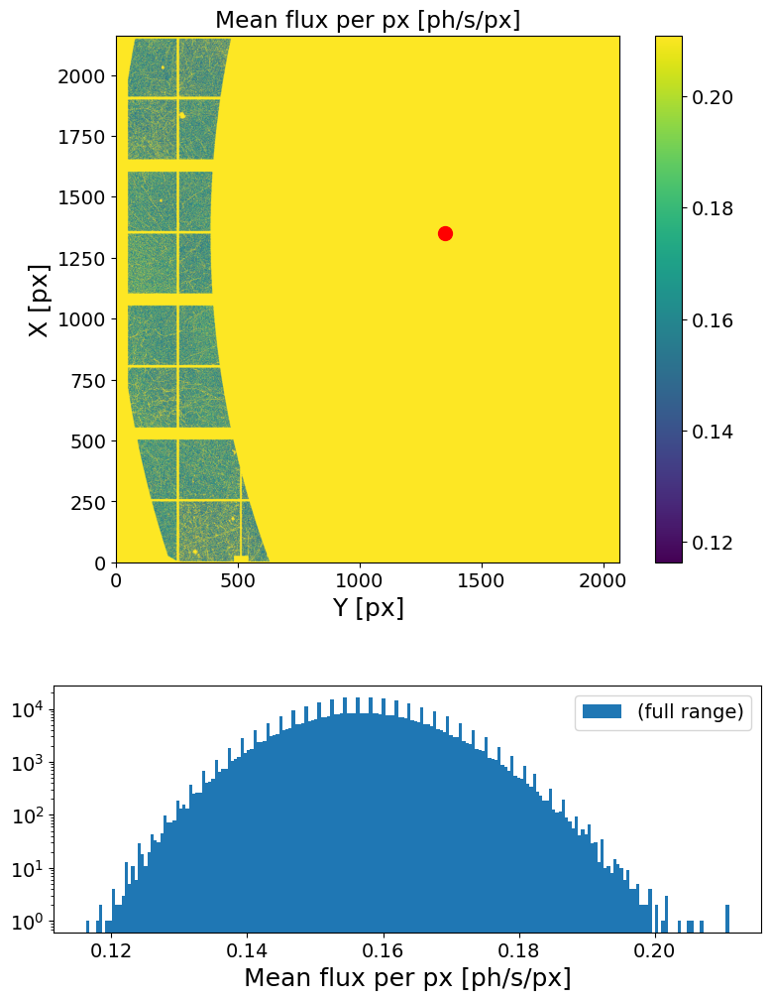

In [17]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

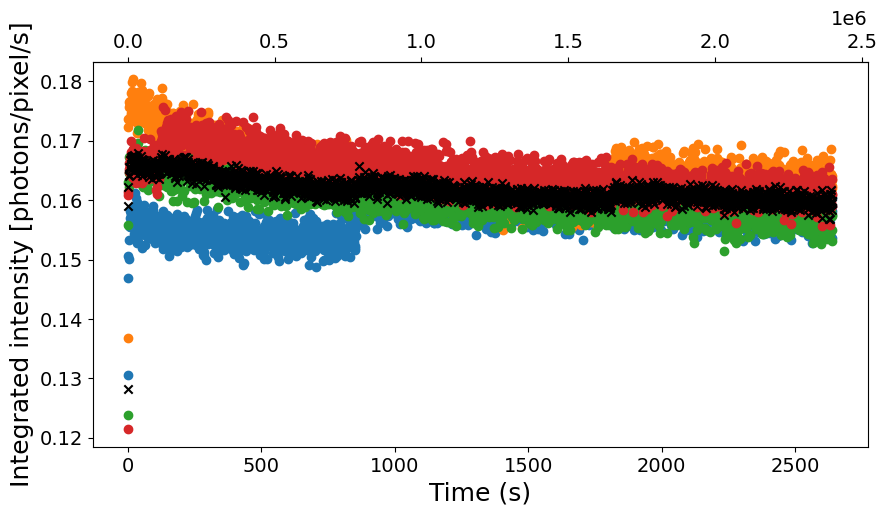

In [18]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep))

    if s==Nscan[0]: It_mean = It
    else:           It_mean[1] += It[1]
    plt.scatter(It[0], It[1], label='It')

It_mean[1] /= len(Nscan)
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It_mean)

plt.scatter(It_mean[0], It_mean[1], label='It mean', color='black', marker='x')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [115]:
##### INPUTS #####
Nfi = int(1e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.47 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.74e-04
	 | memory usage (sparse.csr_array @ float32) = 1.432 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:54<00:00,  1.34s/it]


Done! (elapsed time = 114.36 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 12.8 s)
Processing scan 5...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.4 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 1.468 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:51<00:00,  1.31s/it]


Done! (elapsed time = 111.26 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 12.83 s)
Processing scan 6...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.32 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.74e-04
	 | memory usage (sparse.csr_array @ float32) = 1.431 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:50<00:00,  1.30s/it]


Done! (elapsed time = 110.15 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 12.46 s)
Processing scan 7...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 1.43 s)
	 | 1392640 frames X 523950 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 1.47 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:47<00:00,  1.26s/it]


Done! (elapsed time = 107.38 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 15.58 s)


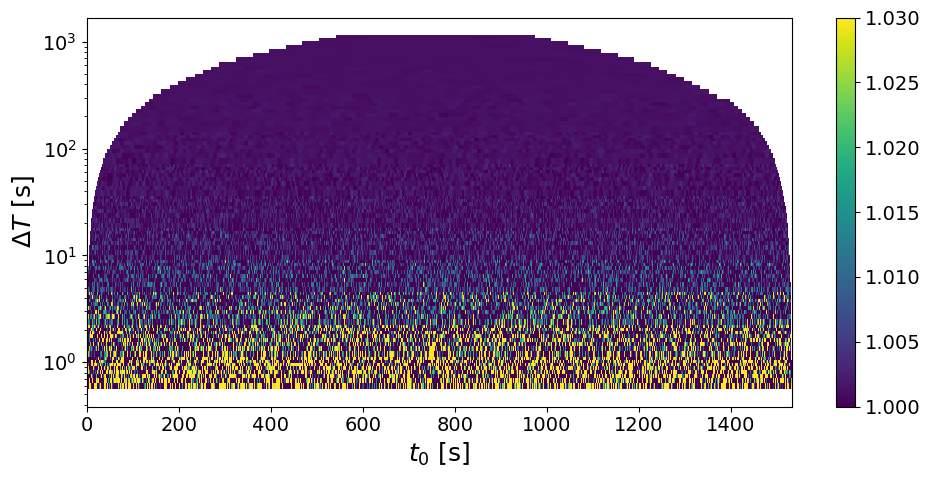

In [116]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.448353,0.026754,5.967278,0.719383,0.028679,3.986673,0.022355,0.000741,3.315726,1.001244,0.000004,0.000398,1.127042


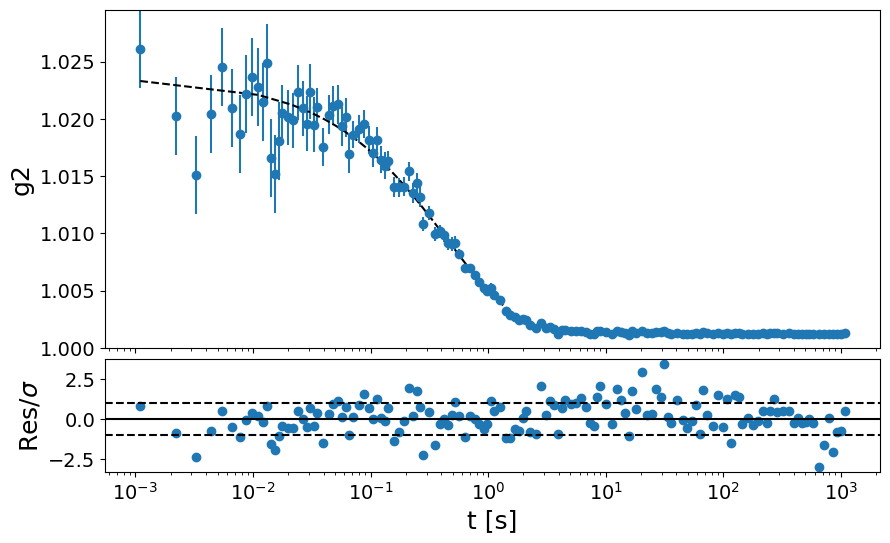

In [117]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=730C, Q=0.19, 30min x 4 @ 1ms ON fp (GeO2_3, dataset 1, scan 4-5-6-7)

In [19]:
#######################################
sample_name = 'GeO2_3_730C'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[3])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 33.01 min
#############################



In [20]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/361 loops)
	 -> loading file eiger4m_v2_spa

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



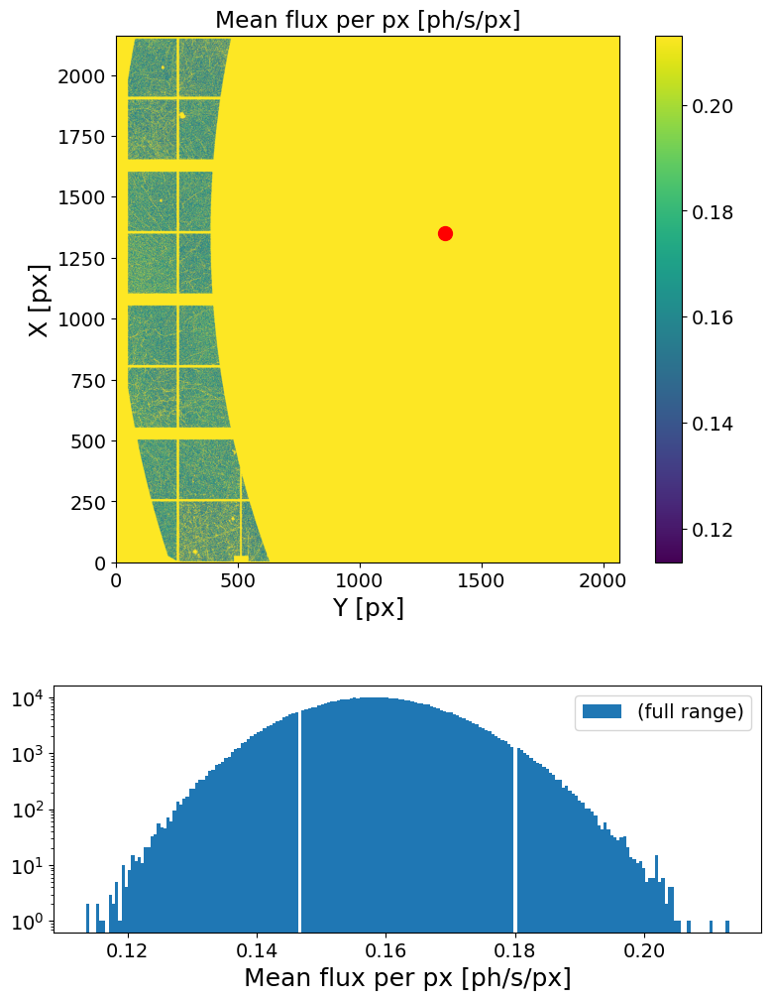

In [21]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

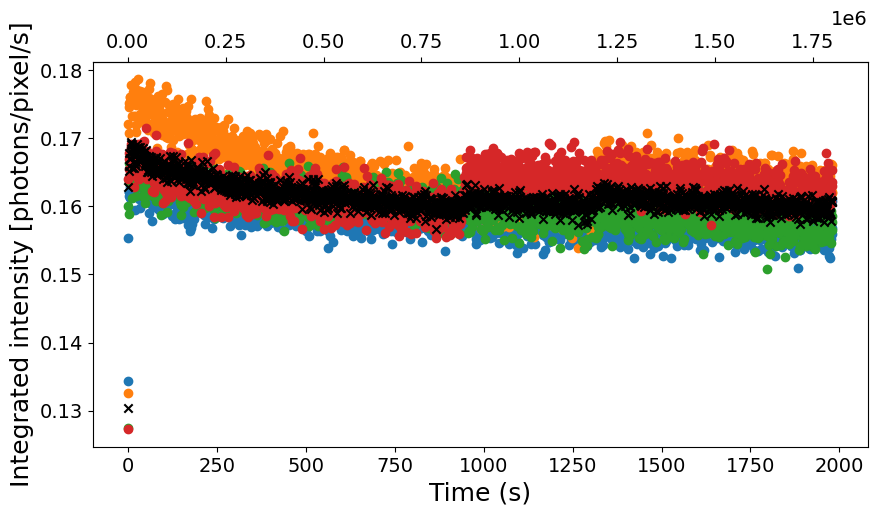

In [22]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep))

    if s==Nscan[0]: It_mean = It
    else:           It_mean[1] += It[1]
    plt.scatter(It[0], It[1], label='It')

It_mean[1] /= len(Nscan)
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It_mean)

plt.scatter(It_mean[0], It_mean[1], label='It mean', color='black', marker='x')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [122]:
##### INPUTS #####
Nfi = int(.7e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 1.08 s)
	 | 1097728 frames X 523950 pixels
	 | sparsity = 1.73e-04
	 | memory usage (sparse.csr_array @ float32) = 1.121 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [01:08<00:00,  1.02s/it]


Done! (elapsed time = 68.04 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 8.49 s)
Processing scan 5...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 1.12 s)
	 | 1097728 frames X 523950 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 1.16 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [01:26<00:00,  1.29s/it]


Done! (elapsed time = 86.28 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 10.95 s)
Processing scan 6...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 1.27 s)
	 | 1097728 frames X 523950 pixels
	 | sparsity = 1.74e-04
	 | memory usage (sparse.csr_array @ float32) = 1.13 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [01:11<00:00,  1.06s/it]


Done! (elapsed time = 71.36 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 7.94 s)
Processing scan 7...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 0.91 s)
	 | 1097728 frames X 523950 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 1.162 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [01:26<00:00,  1.28s/it]


Done! (elapsed time = 86.02 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 10.01 s)


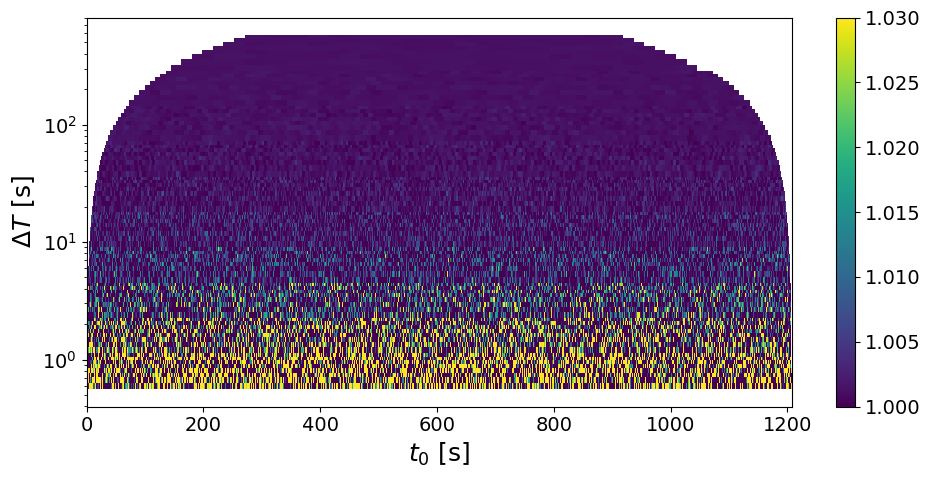

In [123]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.280703,0.023214,8.269911,0.725227,0.040543,5.590336,0.021567,0.000998,4.628607,1.001256,0.000006,0.000569,1.003814


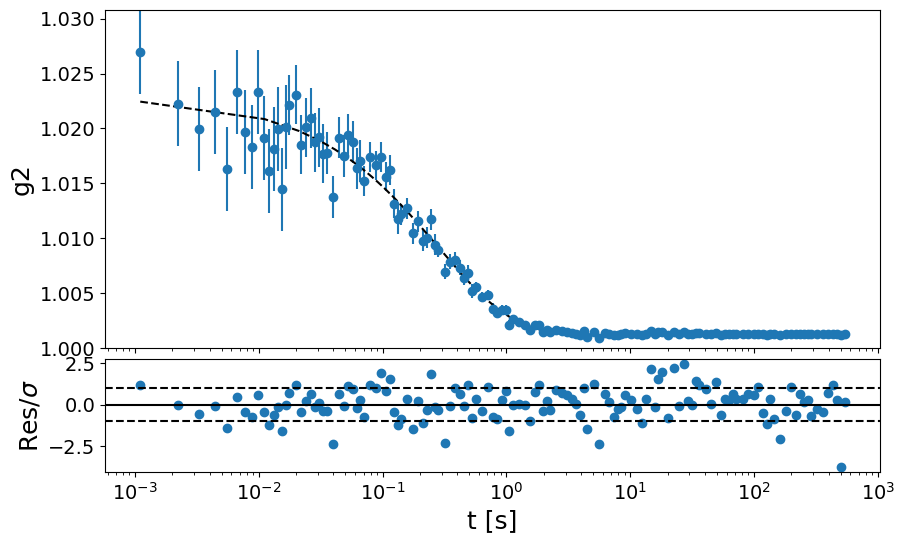

In [124]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=730C, Q=0.19, 40min x 4 @ 1ms ON fp (GeO2_3_att2, dataset 1, scan 4-5-6-7)

In [23]:
#######################################
sample_name = 'GeO2_3_730C_att2'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[-1])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 33.01 min
#############################



In [24]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/361 loops)
	 -> loading file eiger4m_v2_spa

	 -> loading file eiger4m_v2_sparse_frame_0_00050.h5 (51/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00051.h5 (52/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00052.h5 (53/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00053.h5 (54/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00054.h5 (55/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00055.h5 (56/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00056.h5 (57/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00057.h5 (58/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00058.h5 (59/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00059.h5 (60/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00060.h5 (61/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00061.h5 (62/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00062.h5 (63/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00063.h5 (64/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_0006

### Flux check

################################################################################
Maximum count in the whole run -> 3.0
################################################################################



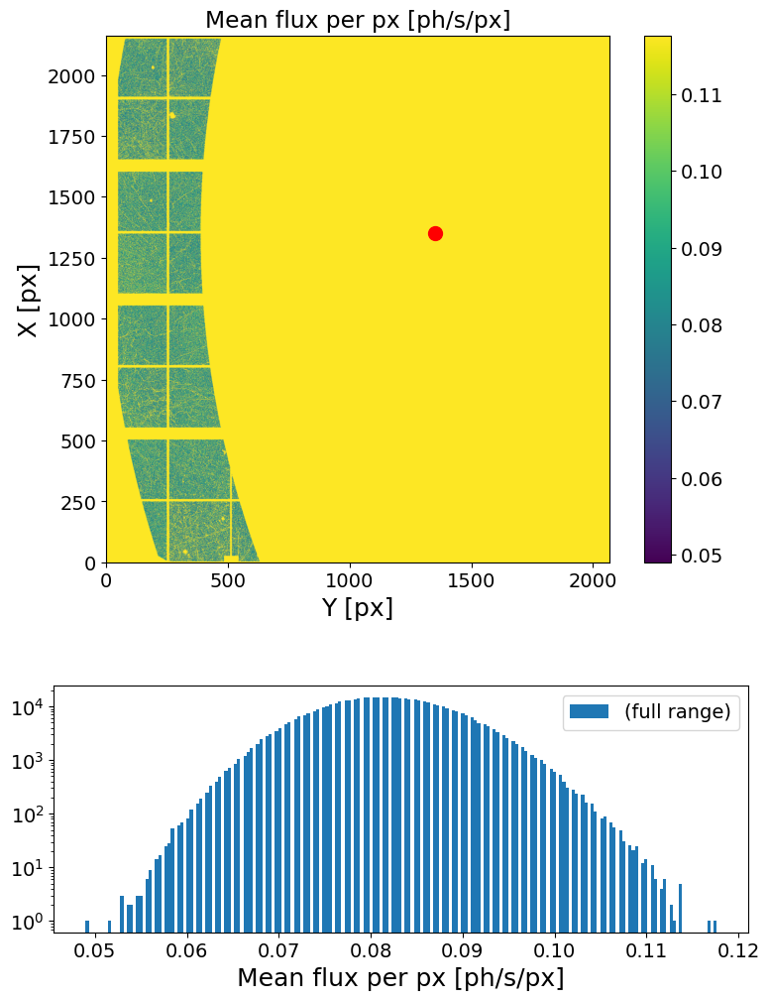

In [25]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

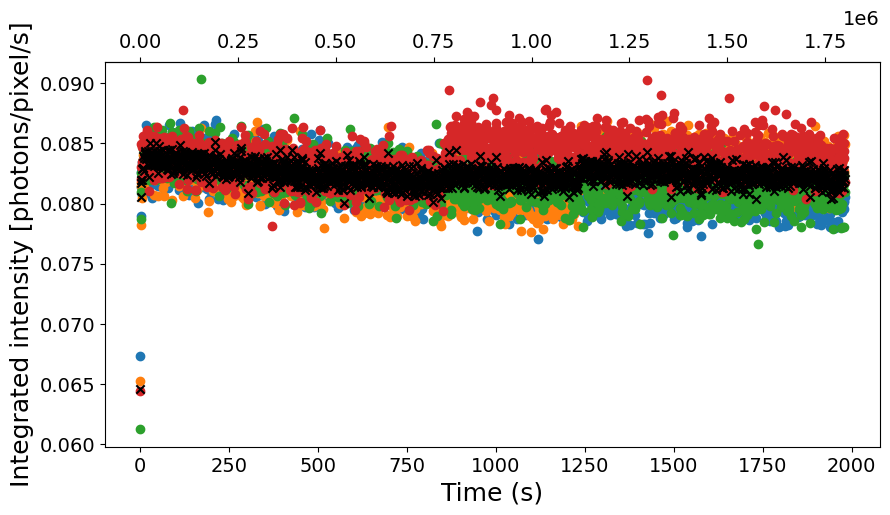

In [26]:
####################
Lbin = 100
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep))

    if s==Nscan[0]: It_mean = It
    else:           It_mean[1] += It[1]
    plt.scatter(It[0], It[1], label='It')

It_mean[1] /= len(Nscan)
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It_mean)

plt.scatter(It_mean[0], It_mean[1], label='It mean', color='black', marker='x')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [129]:
##### INPUTS #####
Nfi = int(.3e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 1.27 s)
	 | 1490944 frames X 523950 pixels
	 | sparsity = 8.95e-05
	 | memory usage (sparse.csr_array @ float32) = 0.792 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:43<00:00,  1.14s/it]


Done! (elapsed time = 103.5 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 11.59 s)
Processing scan 5...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 0.91 s)
	 | 1490944 frames X 523950 pixels
	 | sparsity = 9.05e-05
	 | memory usage (sparse.csr_array @ float32) = 0.802 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:28<00:00,  1.03it/s]


Done! (elapsed time = 88.53 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 11.56 s)
Processing scan 6...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 0.65 s)
	 | 1490944 frames X 523950 pixels
	 | sparsity = 8.99e-05
	 | memory usage (sparse.csr_array @ float32) = 0.796 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:29<00:00,  1.01it/s]


Done! (elapsed time = 89.86 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 13.03 s)
Processing scan 7...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 0.68 s)
	 | 1490944 frames X 523950 pixels
	 | sparsity = 9.22e-05
	 | memory usage (sparse.csr_array @ float32) = 0.816 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:52<00:00,  1.23s/it]


Done! (elapsed time = 112.33 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 15.4 s)


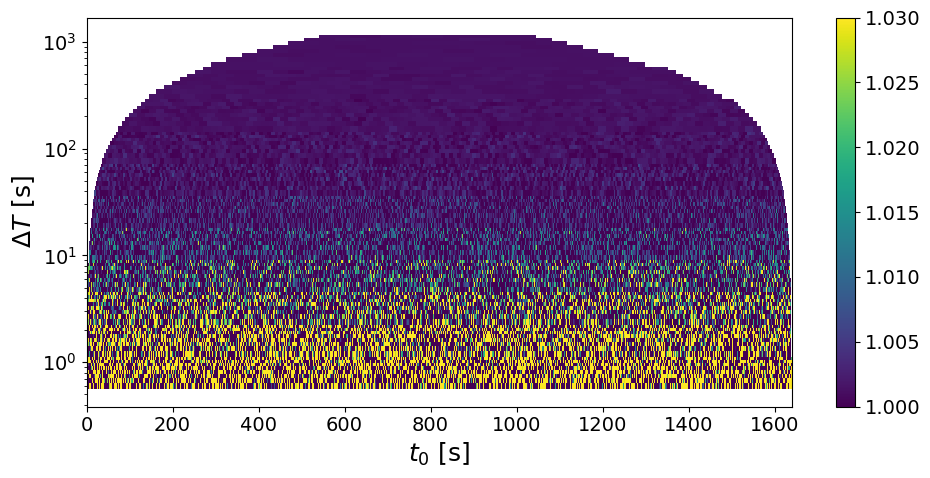

In [130]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.601418,0.061017,10.145582,0.693853,0.044503,6.413916,0.023553,0.001295,5.4971,1.001293,0.000007,0.000735,1.212222


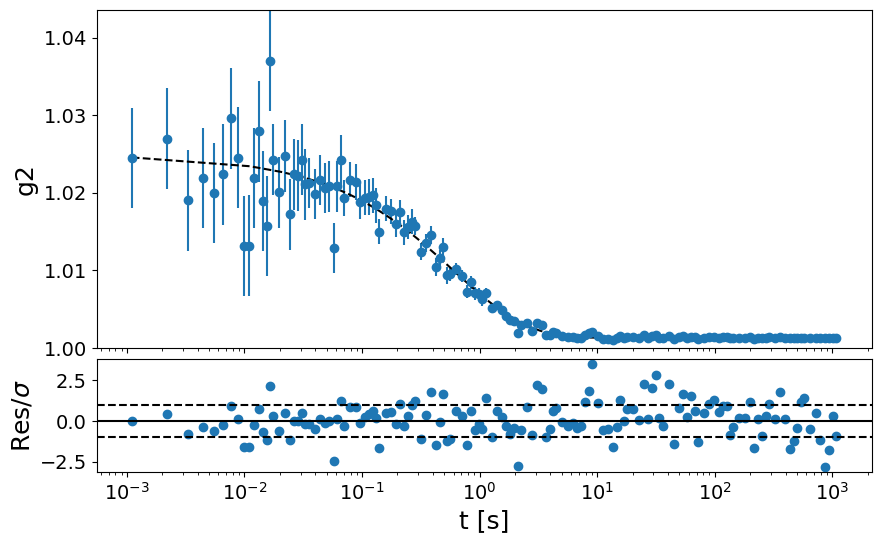

In [131]:
##################
t1_fit = 0
t2_fit = None
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)